In [46]:
%matplotlib inline
%load_ext autoreload
%autoreload 2
    
import matplotlib.pyplot as plt
import cv2
import torch

from facemesh import FaceMesh
from pupil_detection import PupilDetectionModel
from utils import plot as plot_pupils
import numpy as np
import pandas as pd
from tqdm import tqdm

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [2]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

In [3]:
net = FaceMesh().to(device)
net.load_weights("./weights/facemesh.pth")

In [21]:
test_img_path = "/home/newuser/data/0_new_data/P_17/1491942071066_3_-study-dot_test/frame200.png"

In [22]:
img = cv2.imread(test_img_path)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

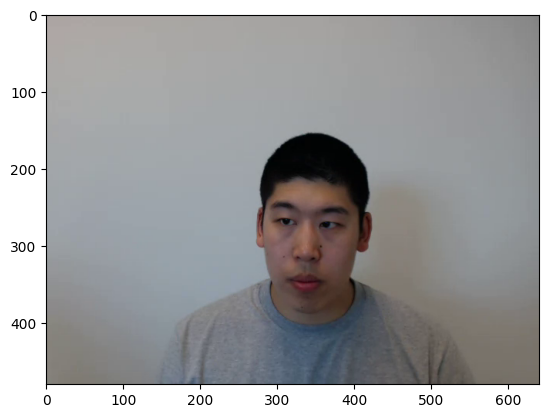

In [23]:
plt.imshow(img, zorder=1)

In [24]:
face_classifier = cv2.CascadeClassifier(
    cv2.data.haarcascades + "haarcascade_frontalface_default.xml"
)

In [25]:
face = face_classifier.detectMultiScale(
    img, scaleFactor=1.1, minNeighbors=5, minSize=(40, 40)
)

In [26]:
face_crop = img[
    face[0][1] - face[0][3] // 3 : face[0][1] + face[0][3] + face[0][3] // 3,
    face[0][0] - face[0][2] // 3 : face[0][0] + face[0][2] + face[0][2] // 3, :
]

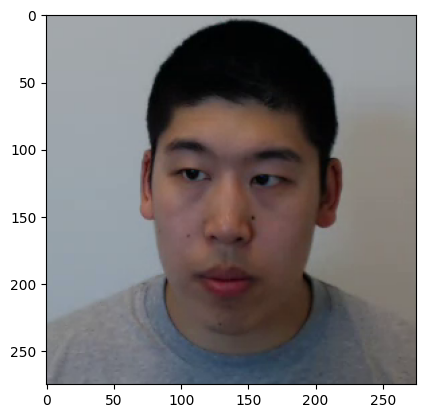

In [27]:
plt.imshow(face_crop, zorder=1)

In [28]:
face_crop = cv2.resize(face_crop, (192, 192), interpolation = cv2.INTER_LINEAR)

In [29]:
detections = net.predict_on_image(face_crop).numpy()
detections.shape

(468, 3)

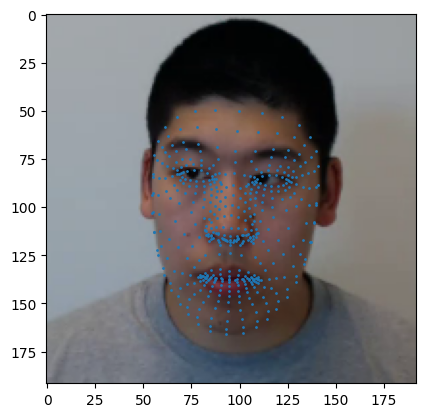

In [30]:
plt.imshow(face_crop, zorder=1)
x, y = detections[:, 0], detections[:, 1]
plt.scatter(x, y, zorder=2, s=1.0)
plt.show()

Get eye:
https://github.com/google/mediapipe/blob/master/mediapipe/python/solutions/face_mesh_connections.py

In [31]:
FACEMESH_RIGHT_EYE_list = [(33, 7), (7, 163), (163, 144), (144, 145),
                                (145, 153), (153, 154), (154, 155), (155, 133),
                                (33, 246), (246, 161), (161, 160), (160, 159),
                                (159, 158), (158, 157), (157, 173), (173, 133)]

left_eye_indices = []
for connection in list(FACEMESH_RIGHT_EYE_list):
    left_eye_indices.append(connection[0])
left_eye_indices.append(FACEMESH_RIGHT_EYE_list[-1][1])

In [37]:
FACEMESH_LEFT_EYE_list = [(263, 249), (249, 390), (390, 373), (373, 374),
                               (374, 380), (380, 381), (381, 382), (382, 362),
                               (263, 466), (466, 388), (388, 387), (387, 386),
                               (386, 385), (385, 384), (384, 398), (398, 362)]

right_eye_indices = []
for connection in list(FACEMESH_LEFT_EYE_list):
    right_eye_indices.append(connection[0])
right_eye_indices.append(FACEMESH_RIGHT_EYE_list[-1][1])

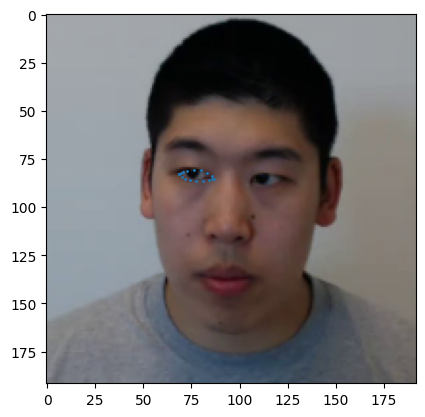

In [32]:
plt.imshow(face_crop, zorder=1)
x, y = detections[:, 0], detections[:, 1]
plt.scatter(x[left_eye_indices], y[left_eye_indices], zorder=2, s=1.0)
plt.show()

In [33]:
points = detections[left_eye_indices]

sorted_point_x = sorted(points, key = lambda x: x[0])
sorted_point_y = sorted(points, key = lambda x: x[1])

left_point = sorted_point_x[0]
right_point = sorted_point_x[-1]
up_point = sorted_point_y[0]
down_point = sorted_point_y[-1]

margin_x = (64 - (right_point[0] - left_point[0])) / 2
margin_y = (64 - (down_point[1] - up_point[1])) / 2

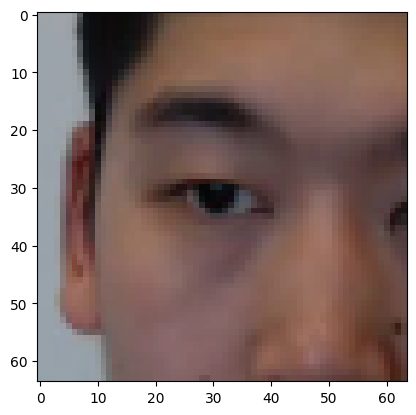

In [34]:
img_eye = face_crop[int(up_point[1] - margin_y) : int(down_point[1] + margin_y),
              int(left_point[0] - margin_x) : int(right_point[0] + margin_x), :]

plt.imshow(img_eye, zorder=1)

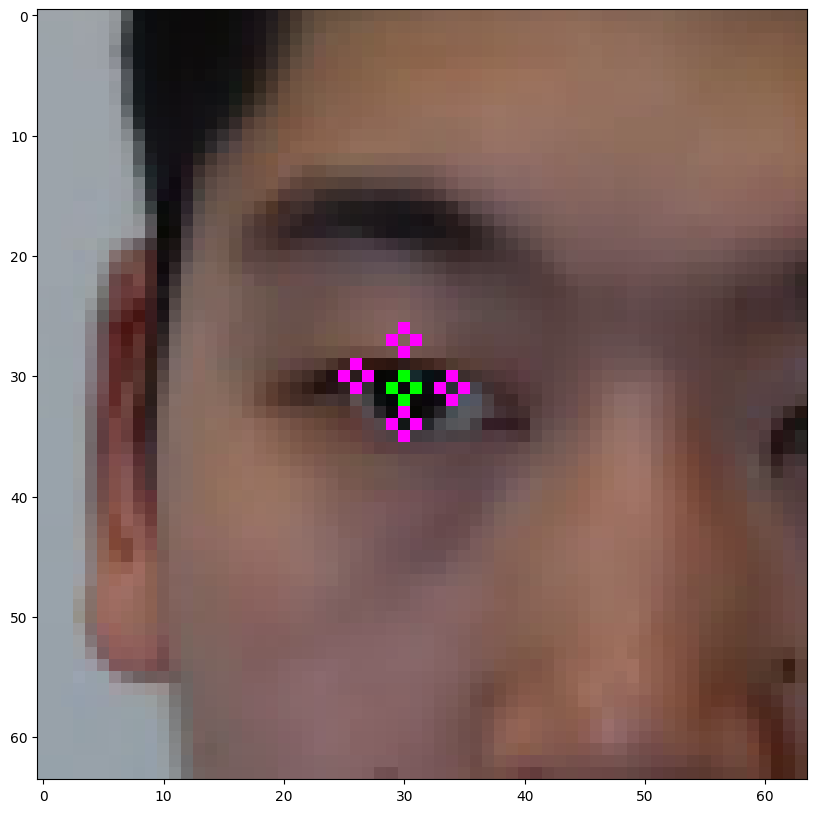

In [35]:
m = PupilDetectionModel(model_path = "./weights/irislandmarks.pth")
eye_contour, iris = m(cv2.cvtColor(img_eye, cv2.COLOR_RGB2BGR))
plot_pupils(img_eye, iris, eye_contour, plot_eye=False)

In [46]:
np.array([0,1,2,3]).reshape((2, -1))

array([[0, 1],
       [2, 3]])

In [151]:
class FeatureExtractor:
    def __init__(
        self,
        facemesh_weights: str = "./weights/facemesh.pth",
        pupil_detector_weights: str = "./weights/irislandmarks.pth",
        device: str = "cpu"
    ):
        self.face_detection_model = cv2.CascadeClassifier(
            cv2.data.haarcascades + "haarcascade_frontalface_default.xml"
        )
        self.facemesh =  FaceMesh().to(device)
        self.facemesh.load_weights(facemesh_weights)
        self.pupil_detector = PupilDetectionModel(model_path = "./weights/irislandmarks.pth")
        self.left_eye_indices = [33, 7, 163, 144, 145, 153, 154, 155, 33,
                                 246, 161, 160, 159, 158, 157, 173, 133]
        self.right_eye_indices = [263, 249, 390, 373, 374, 380, 381, 382,
                                  263, 466, 388, 387, 386, 385, 384, 398, 133]

    def get_eye_crop(self, points: np.array, img: np.array, which_eye: str):
        h, w, _ = img.shape
        sorted_point_x = sorted(points, key = lambda x: x[0])
        sorted_point_y = sorted(points, key = lambda x: x[1])
        left_point = sorted_point_x[0]
        right_point = sorted_point_x[-1]
        up_point = sorted_point_y[0]
        down_point = sorted_point_y[-1]
        multiplicator = 3/4 if which_eye == "left" else 1/4
        # multiplicator = 1/2
        margin_x_left = max(64 - (right_point[0] - left_point[0]), 0) * multiplicator
        margin_x_right = max(64 - (right_point[0] - left_point[0]), 0) * (1 - multiplicator)
        margin_y = max(64 - (down_point[1] - up_point[1]), 0) / 2
        min_x, max_x = max(0, int(left_point[0] - margin_x_left)), min(w, int(right_point[0] + margin_x_right))
        min_y, max_y = max(0, int(up_point[1] - margin_y)), min(h, int(down_point[1] + margin_y))
        img_eye = img[min_y: max_y, min_x: max_x, :]
        left_top_point = (min_x, min_y) 
        return img_eye, left_top_point

    def get_pupil(self, points: np.array, img: np.array, which_eye: str, plot: bool = False):
        img_eye, left_top_point = self.get_eye_crop(points, img, which_eye = which_eye)
        eye_contour, iris = self.pupil_detector(cv2.cvtColor(img_eye, cv2.COLOR_RGB2BGR))
        if plot:
            plot_pupils(img_eye, iris, eye_contour, plot_eye=False)
        eye_contour, iris = eye_contour.reshape((-1, 3)), iris.reshape((-1, 3))
        eye_contour[:, 0] = eye_contour[:, 0] + left_top_point[0]
        eye_contour[:, 1] = eye_contour[:, 1] + left_top_point[1]
        iris[:, 0] = iris[:, 0] + left_top_point[0]
        iris[:, 1] = iris[:, 1] + left_top_point[1]
        return iris, eye_contour

    def extract_features(self, img_path: str, plot: bool = False):
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        if plot:
            plt.imshow(img)
            plt.show()
        face_rects = self.face_detection_model.detectMultiScale(
            img, scaleFactor=1.1, minNeighbors=5, minSize=(40, 40)
        )
        no_face_list = []
        if len(face_rects) > 0:
            if len(face_rects) > 1:
                face_rect = sorted(face_rects, key = lambda x: x[2] * x[3])[-1]
            else:
                face_rect = face_rects[0]
            face_crop = img[
                max(face_rect[1] - face_rect[3] // 3, 0) : min(face_rect[1] + face_rect[3] + face_rect[3] // 3, img.shape[1]),
                max(face_rect[0] - face_rect[2] // 3, 0) : min(face_rect[0] + face_rect[2] + face_rect[2] // 3, img.shape[1]), :
            ]
        else:
            no_face_list.append(img_path)
            face_crop = img.copy()
        face_crop = cv2.resize(face_crop, (192, 192), interpolation = cv2.INTER_LINEAR)
        facemesh_points = self.facemesh .predict_on_image(face_crop).numpy()
        left_eye_points = facemesh_points[self.left_eye_indices]
        right_eye_points = facemesh_points[self.right_eye_indices]
        left_pupil_points, left_eye_points = self.get_pupil(left_eye_points, face_crop, which_eye = "left", plot = plot)
        right_pupil_points, right_eye_points = self.get_pupil(right_eye_points, face_crop, which_eye = "right", plot = plot)
        if plot:
            plt.imshow(face_crop, zorder=1)
            x, y = facemesh_points[:, 0], facemesh_points[:, 1]
            plt.scatter(x, y, zorder=2, s=1.0)
            plt.scatter(left_pupil_points[:, 0], left_pupil_points[:, 1], zorder=2, s=1.0)
            plt.scatter(right_pupil_points[:, 0], right_pupil_points[:, 1], zorder=2, s=1.0)
            plt.show()
        return {
            "facemesh": facemesh_points.tolist(),
            "left_pupil": left_pupil_points.tolist(),
            "right_pupil": right_pupil_points.tolist()
        }, no_face_list, len(face_rects)

In [154]:
feature_extractor = FeatureExtractor()

In [104]:
test_img_path = "/home/newuser/data/0_new_data/P_17/1491942071066_3_-study-dot_test/frame200.png"

34.58759880065918 11.529199600219727


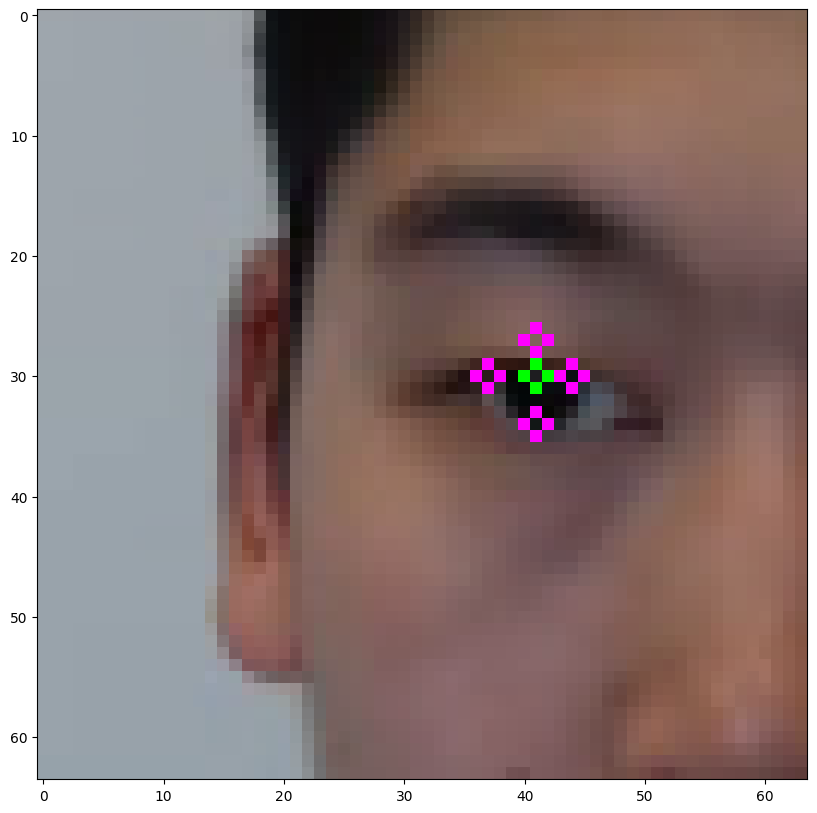

6.181329727172852 18.543989181518555


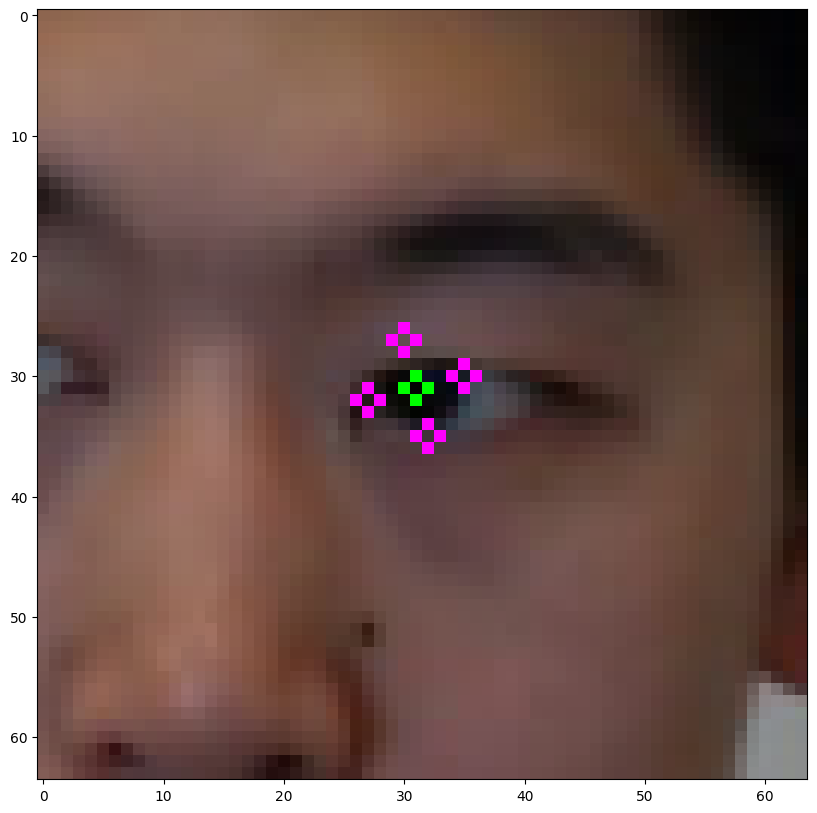

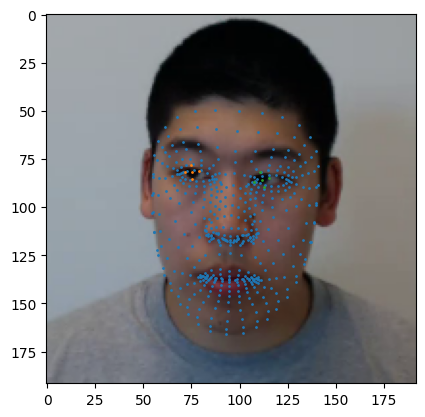

In [105]:
res_dict, _, _ = feature_extractor.extract_features(
    img_path = test_img_path,
    plot=True,
)

In [77]:
%%timeit
res_dict = feature_extractor.extract_features(
    img_path = test_img_path,
    plot=False,
)

52.2 ms ± 695 µs per loop (mean ± std. dev. of 7 runs, 10 loops each)


In [80]:
1 / (52.2 / 1000)

19.157088122605362

## Extract features

In [17]:
import concurrent.futures

In [15]:
clicks_df = pd.read_csv("../data/data_clicks.csv")

In [18]:
clicks_df.head()

,paths,x_normalized,y_normalized
0,/home/newuser/data/0_new_data/P_15/14919337389...,0.128472,0.437778
1,/home/newuser/data/0_new_data/P_15/14919337389...,0.027083,0.046667
2,/home/newuser/data/0_new_data/P_15/14919337389...,0.500694,0.044444
3,/home/newuser/data/0_new_data/P_15/14919337389...,0.972917,0.044444
4,/home/newuser/data/0_new_data/P_15/14919337389...,0.028472,0.378889


In [53]:
image_paths = clicks_df["paths"].values

  0%|                                                                                                  | 0/1227 [00:00<?, ?it/s]

/home/newuser/data/0_new_data/P_40/1492693878775_21_-study-educational_advantages_of_social_networking_sites_writing/frame44.png


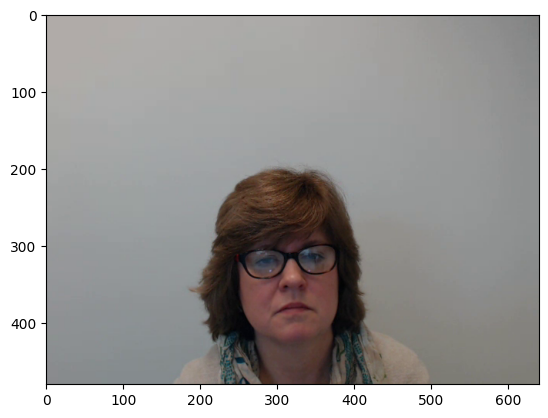

1


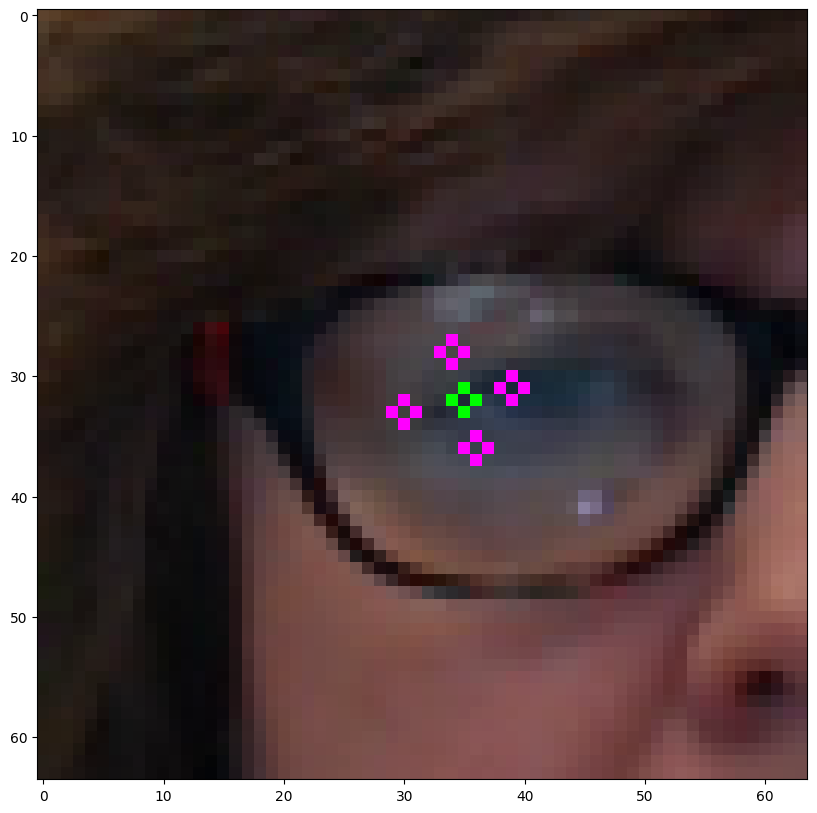

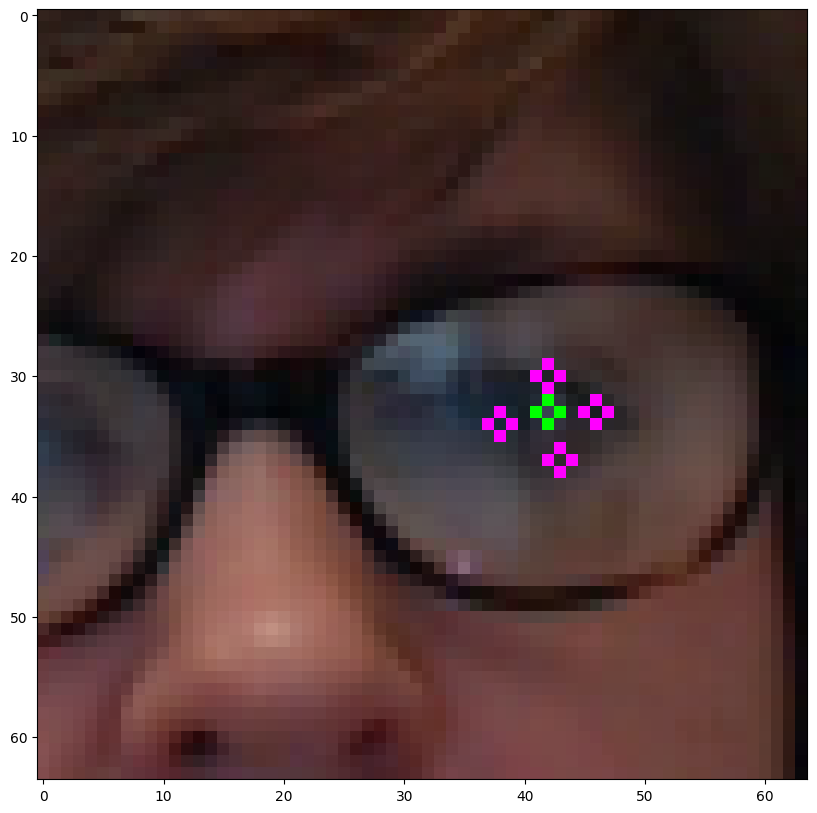

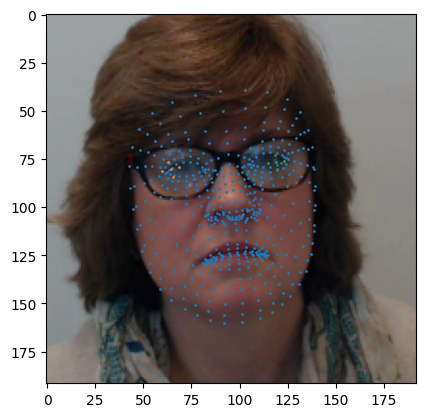

  0%|                                                                                          | 1/1227 [00:00<16:08,  1.27it/s]

/home/newuser/data/0_new_data/P_35/1492538568613_11_-study-benefits_of_running_writing/frame38.png


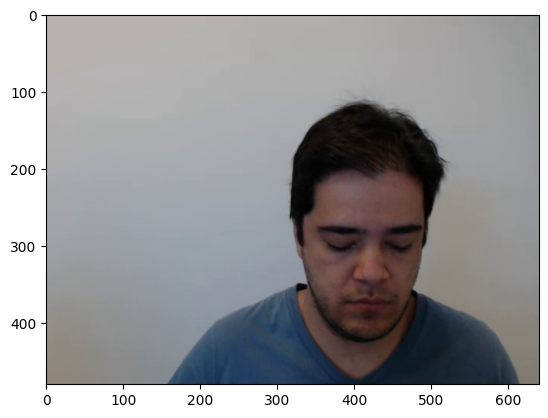

1


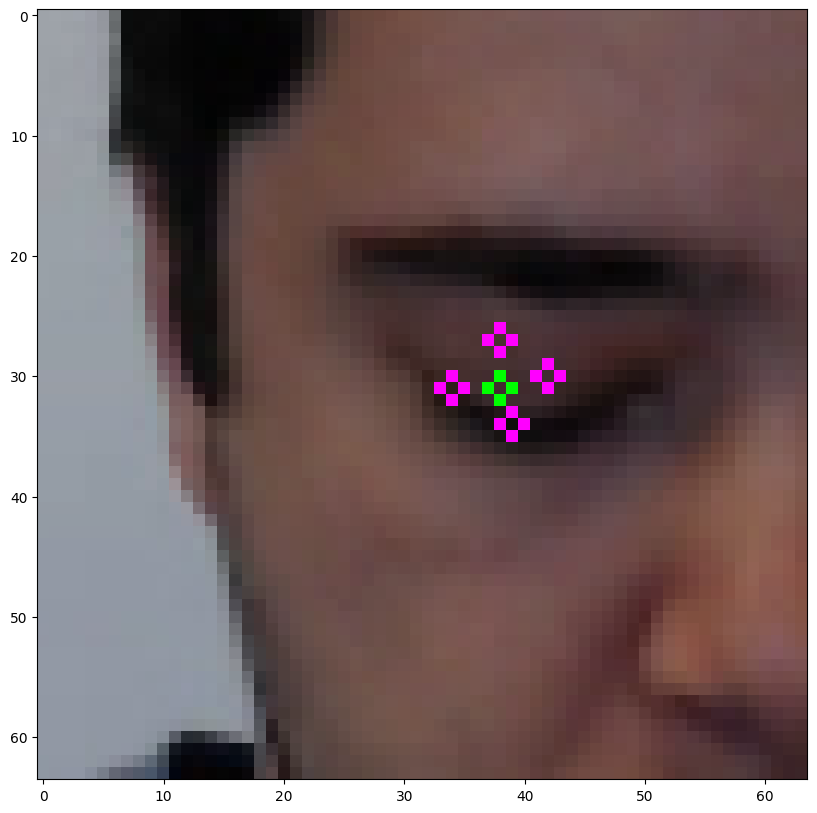

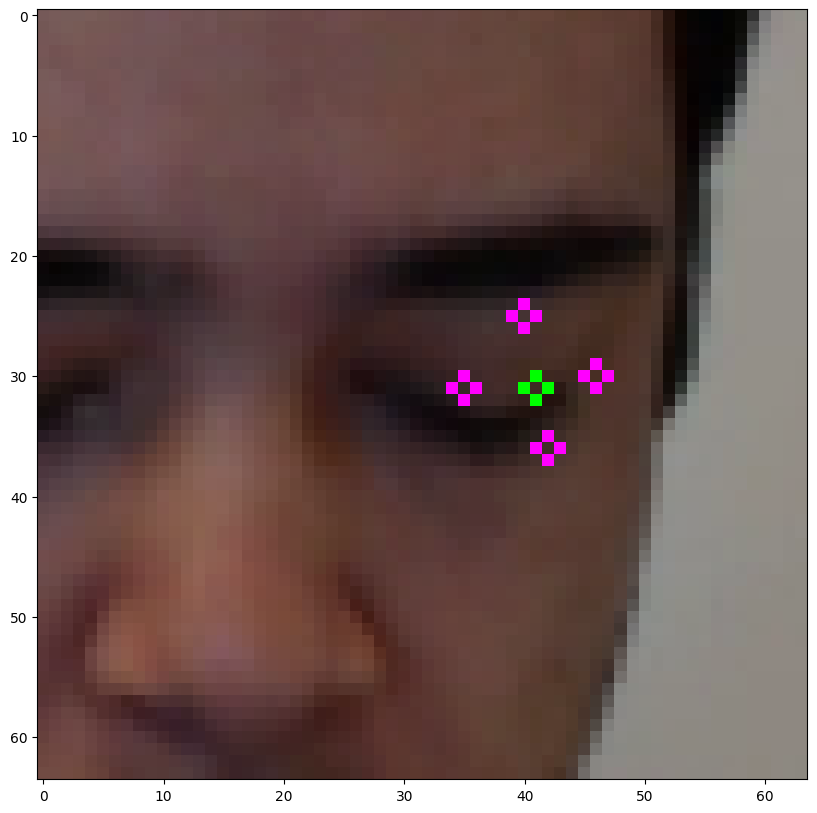

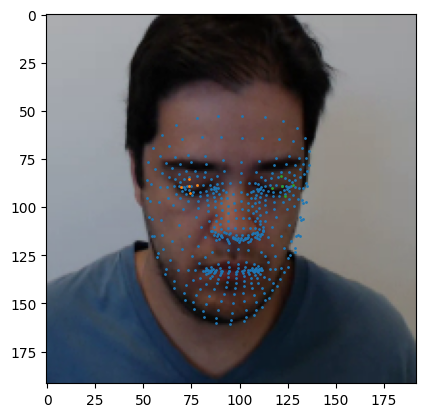

  0%|▏                                                                                         | 2/1227 [00:01<16:08,  1.26it/s]

/home/newuser/data/0_new_data/P_57/1493143714690_33_-study-tooth_abscess_writing/frame6788.png


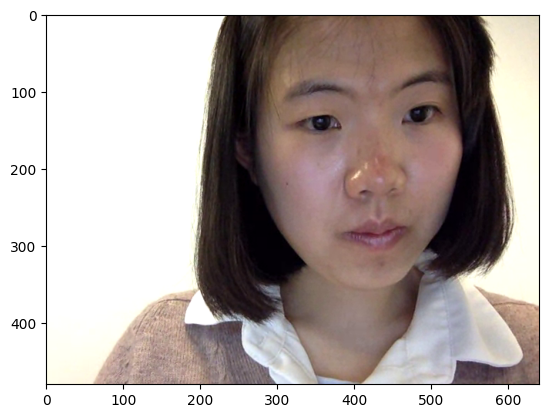

1


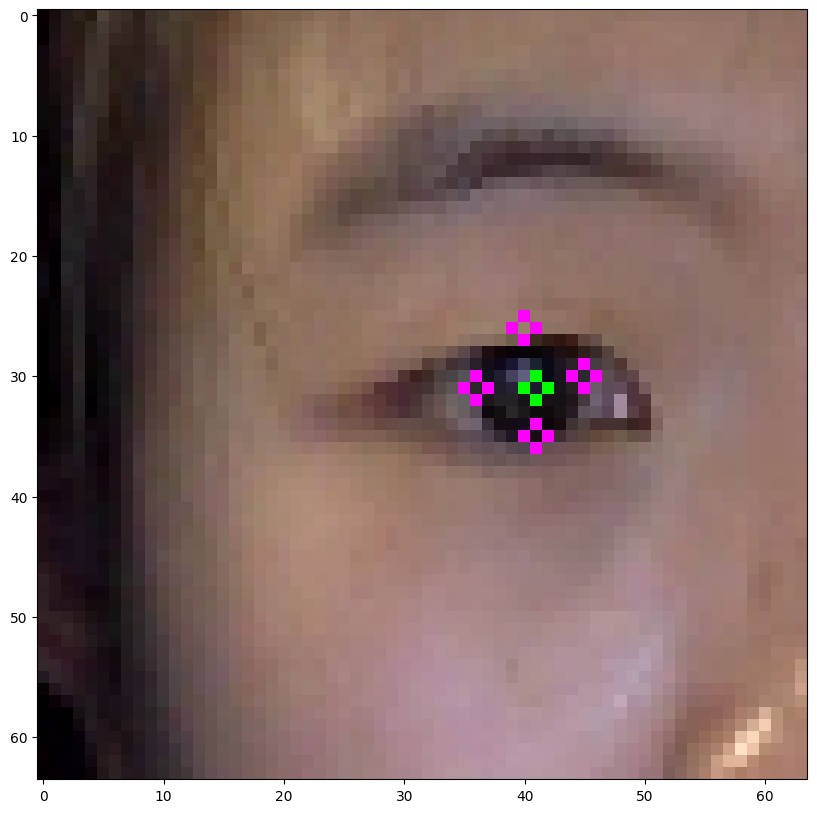

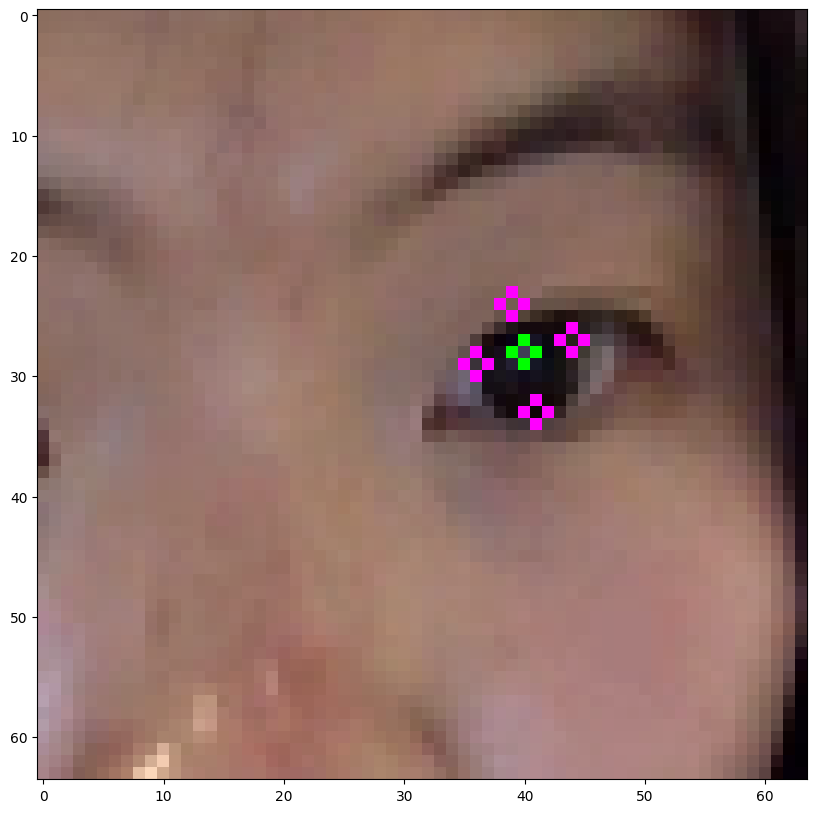

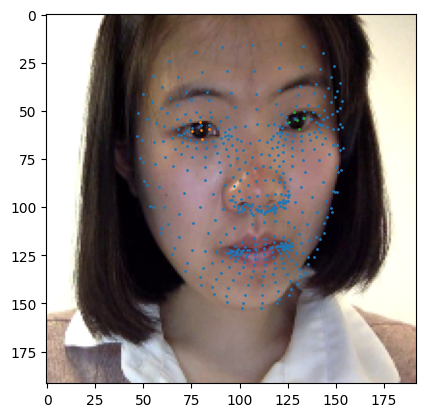

  0%|▏                                                                                         | 3/1227 [00:02<16:41,  1.22it/s]

/home/newuser/data/0_new_data/P_17/1491942071066_3_-study-dot_test/frame509.png


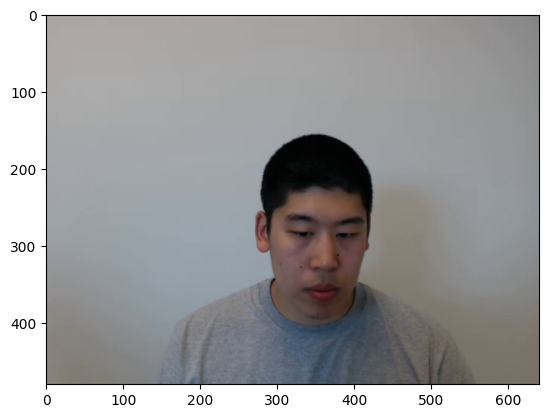

1


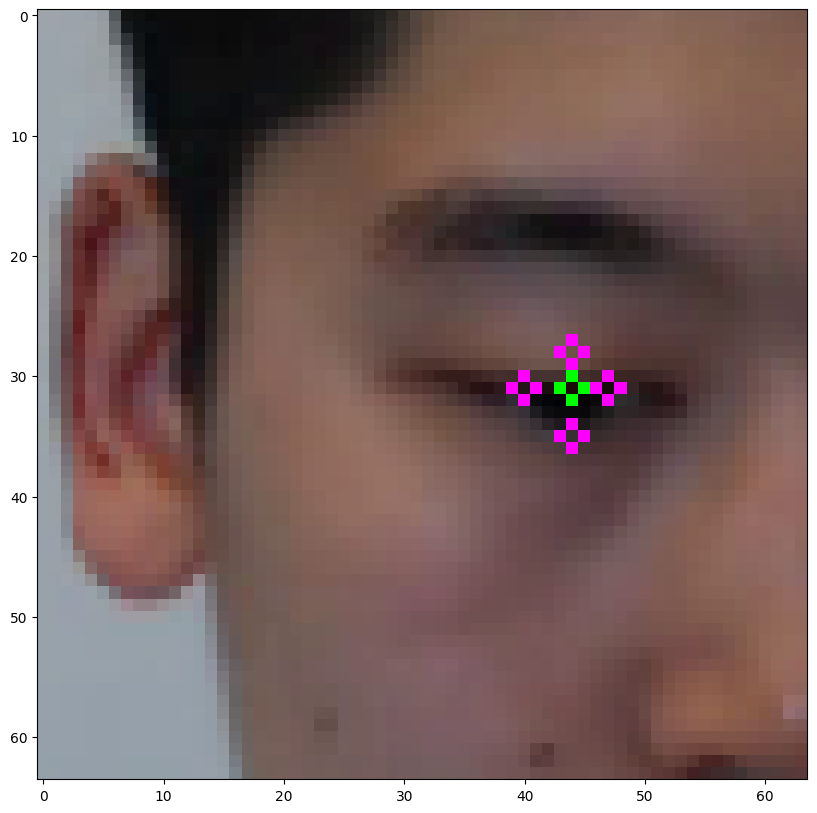

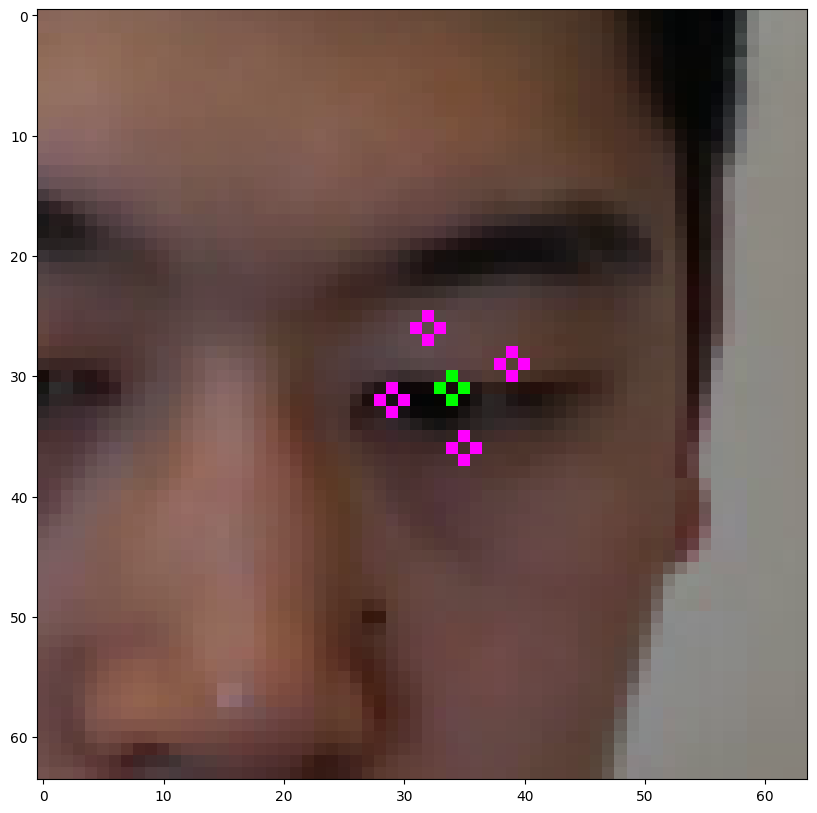

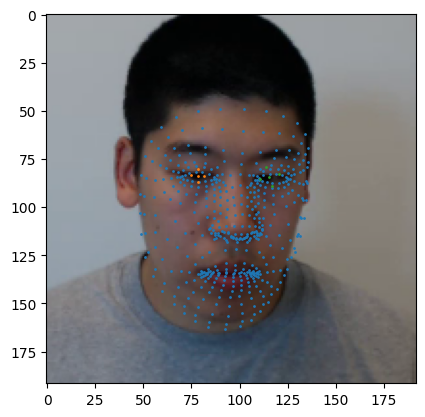

  0%|▎                                                                                         | 4/1227 [00:03<16:18,  1.25it/s]

/home/newuser/data/0_new_data/P_64/1493237348836_17_-study-educational_advantages_of_social_networking_sites_writing/frame1281.png


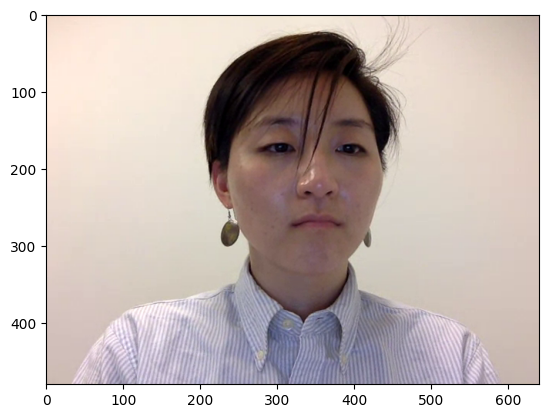

1


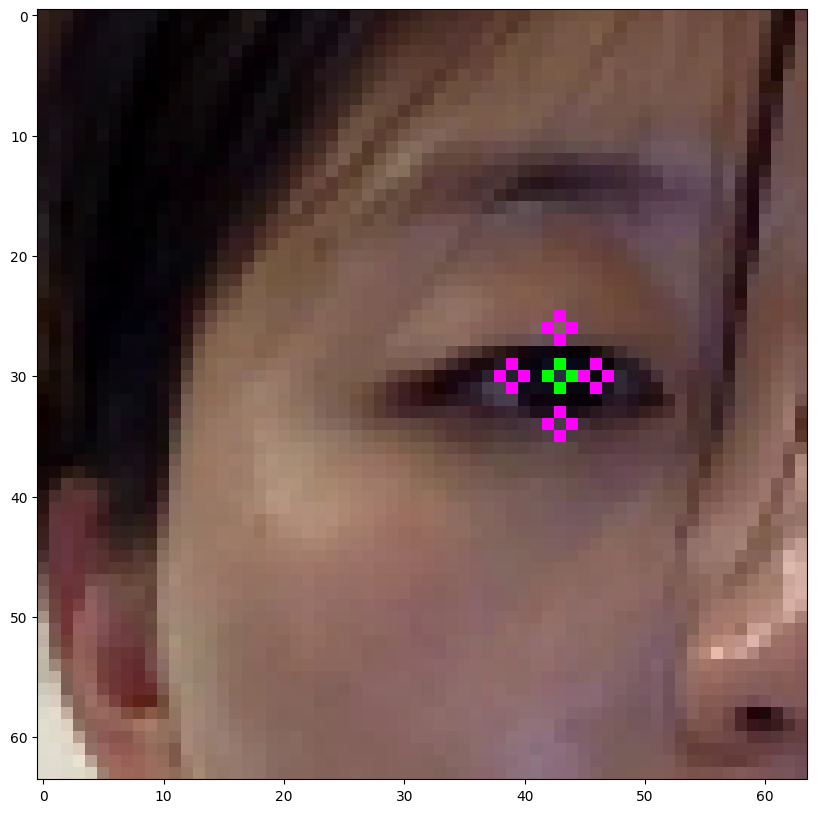

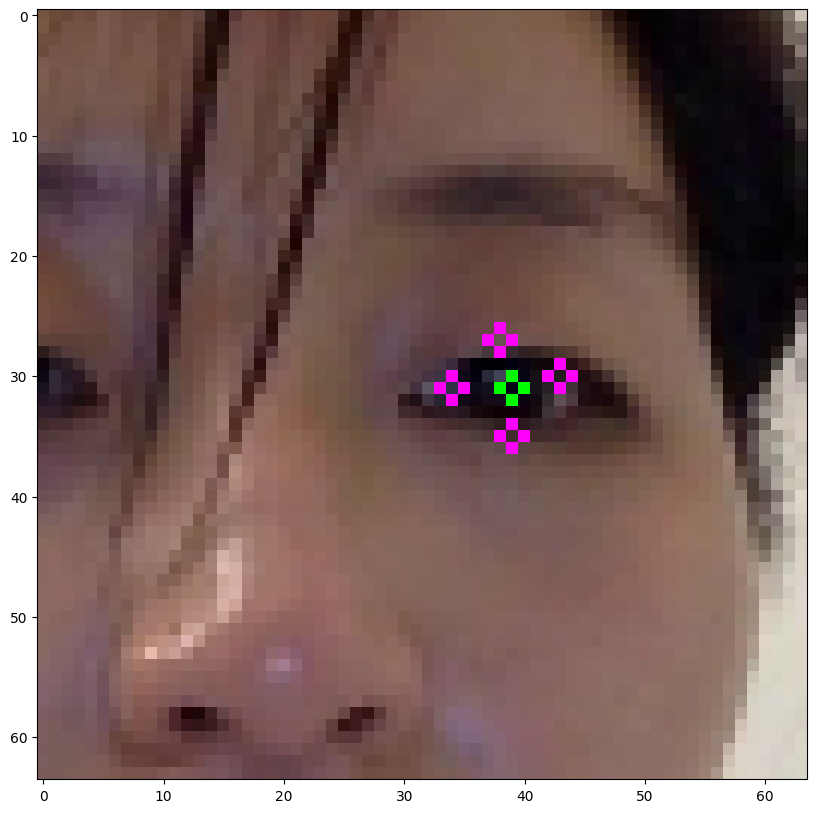

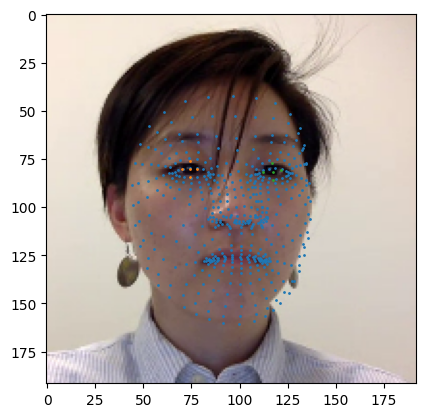

  0%|▎                                                                                         | 5/1227 [00:04<16:22,  1.24it/s]

/home/newuser/data/0_new_data/P_23/1492097686620_12_-study-educational_advantages_of_social_networking_sites/frame587.png


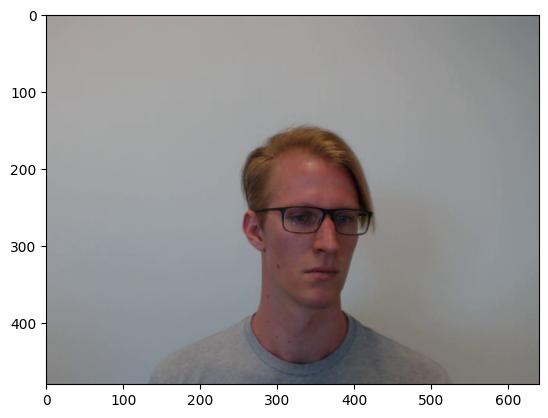

1


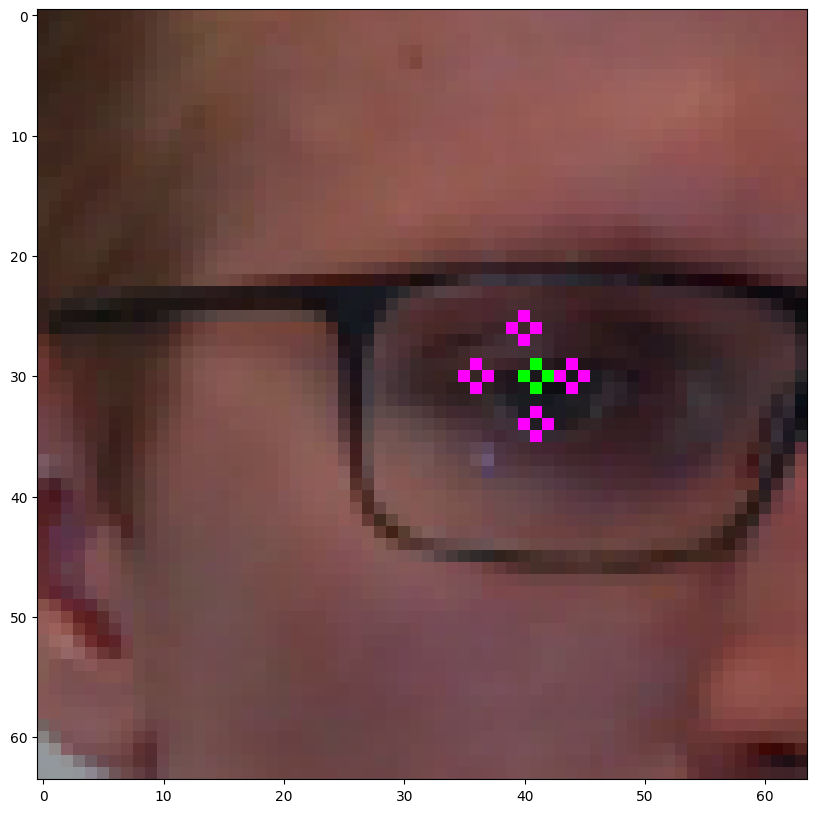

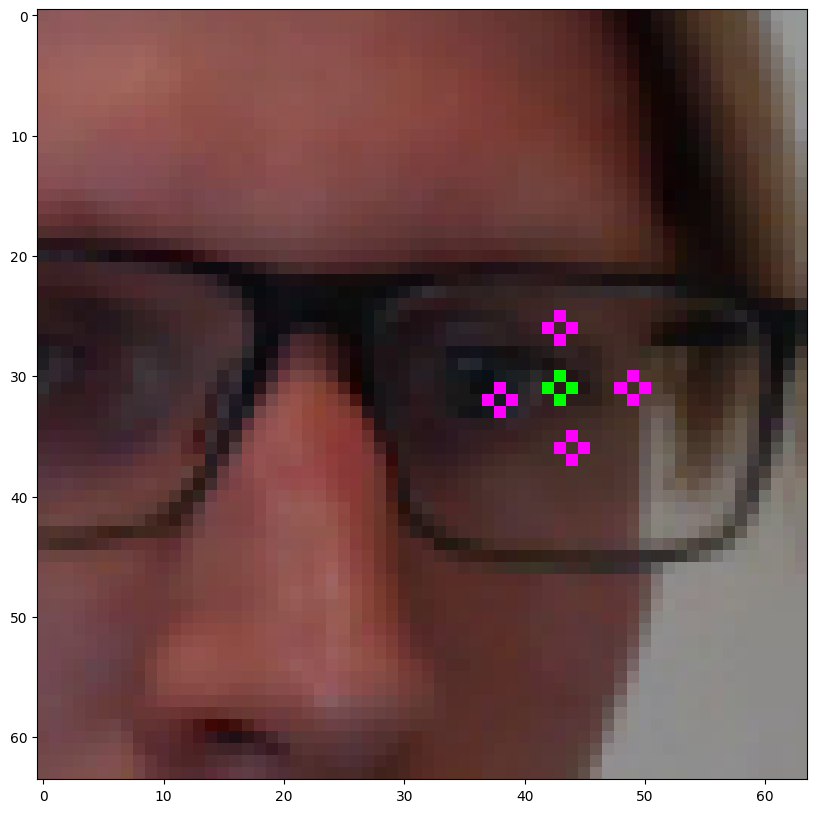

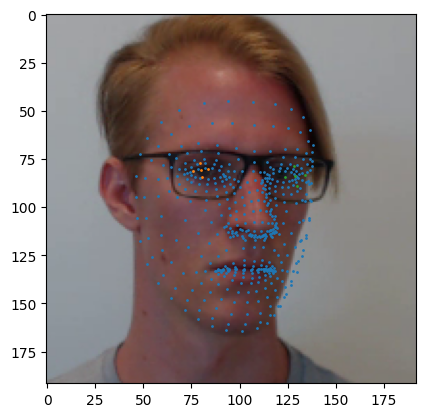

  0%|▍                                                                                         | 6/1227 [00:04<16:20,  1.25it/s]

/home/newuser/data/0_new_data/P_25/1492110782158_3_-study-dot_test/frame99.png


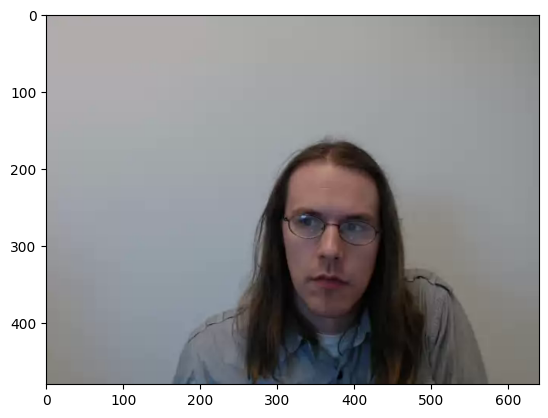

1


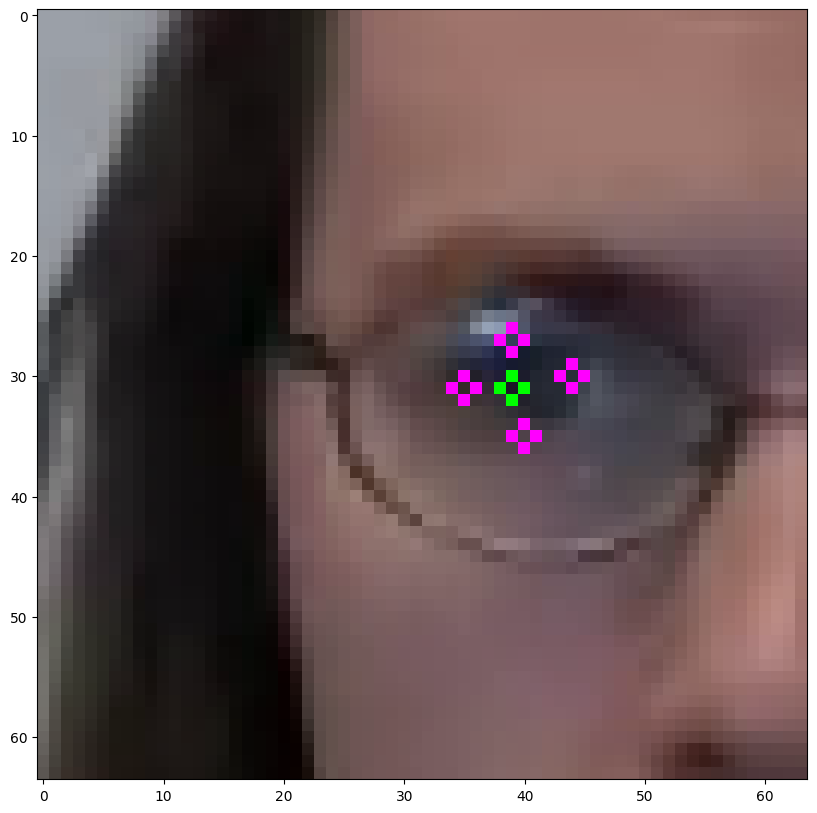

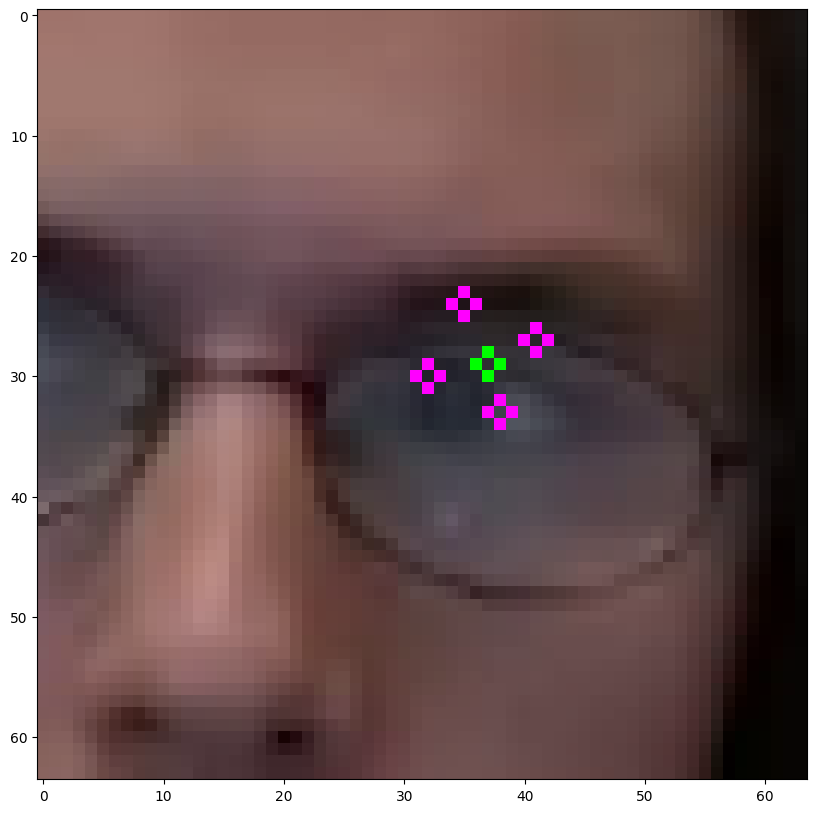

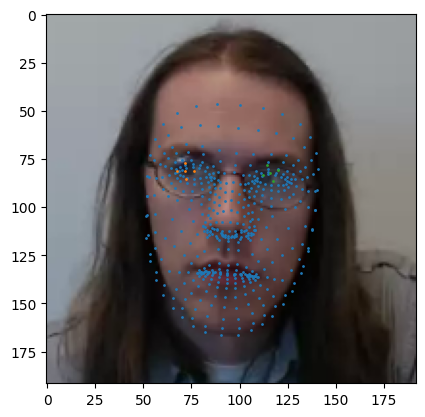

  1%|▌                                                                                         | 7/1227 [00:05<16:04,  1.26it/s]

/home/newuser/data/0_new_data/P_37/1492546151879_23_-study-tooth_abscess_writing/frame40.png


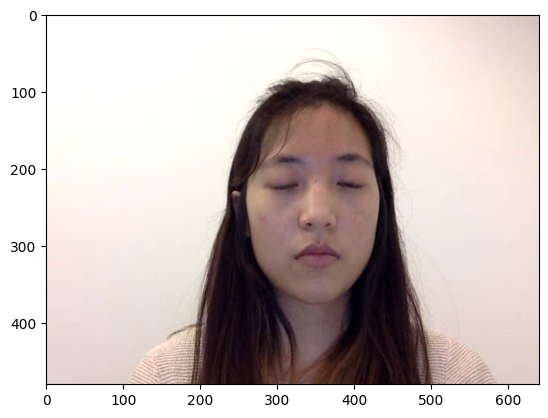

1


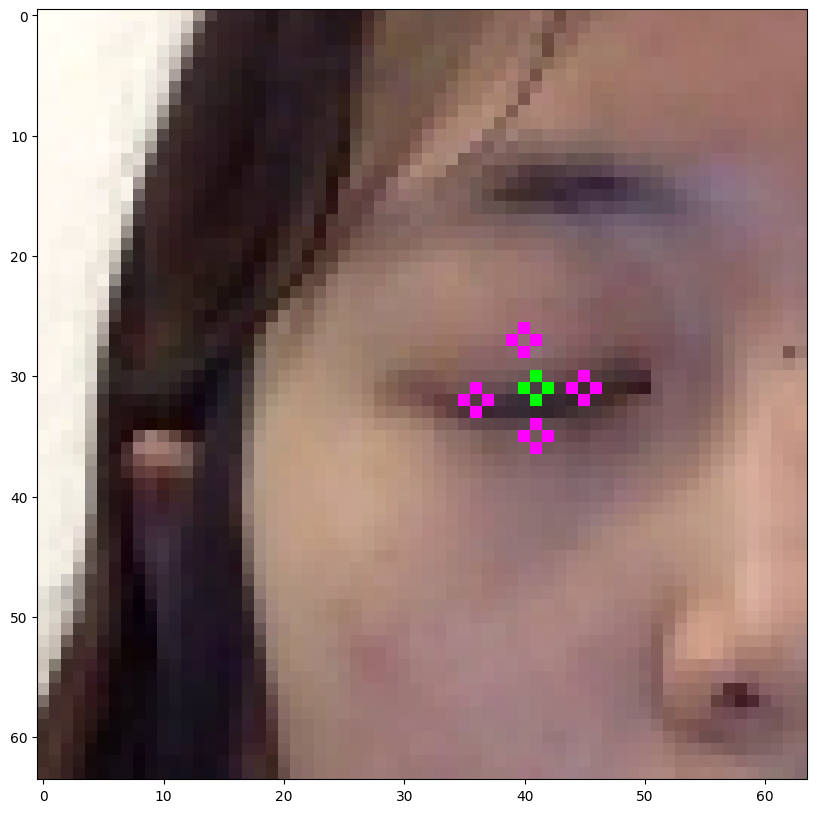

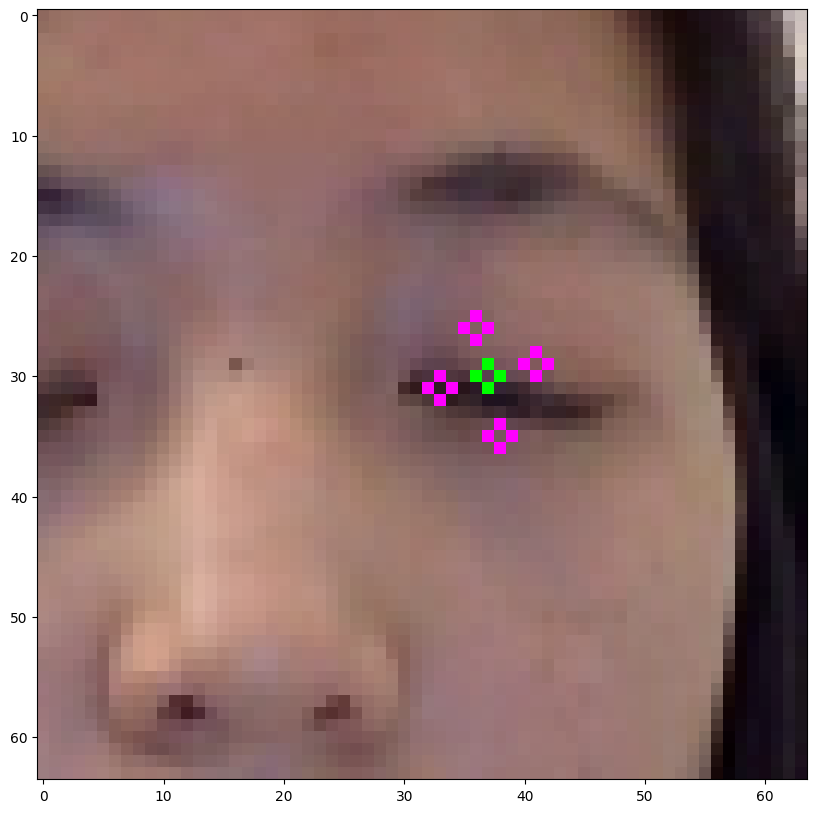

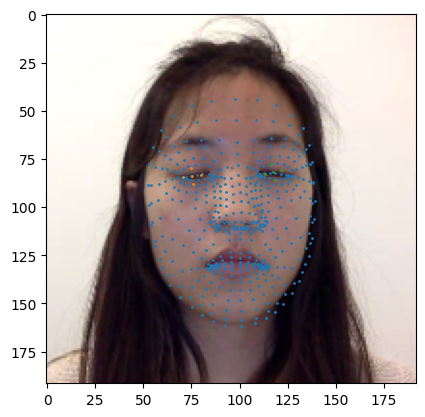

  1%|▌                                                                                         | 8/1227 [00:06<16:06,  1.26it/s]

/home/newuser/data/0_new_data/P_57/1493143714690_3_-study-dot_test/frame369.png


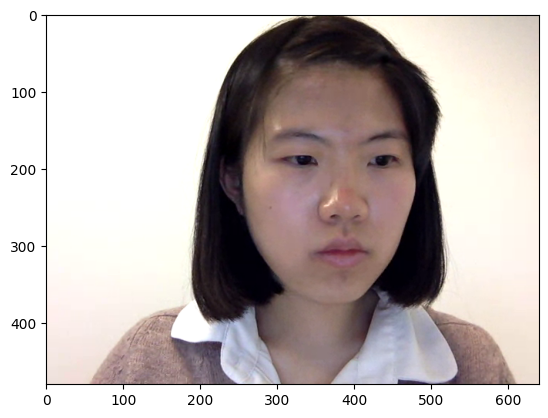

1


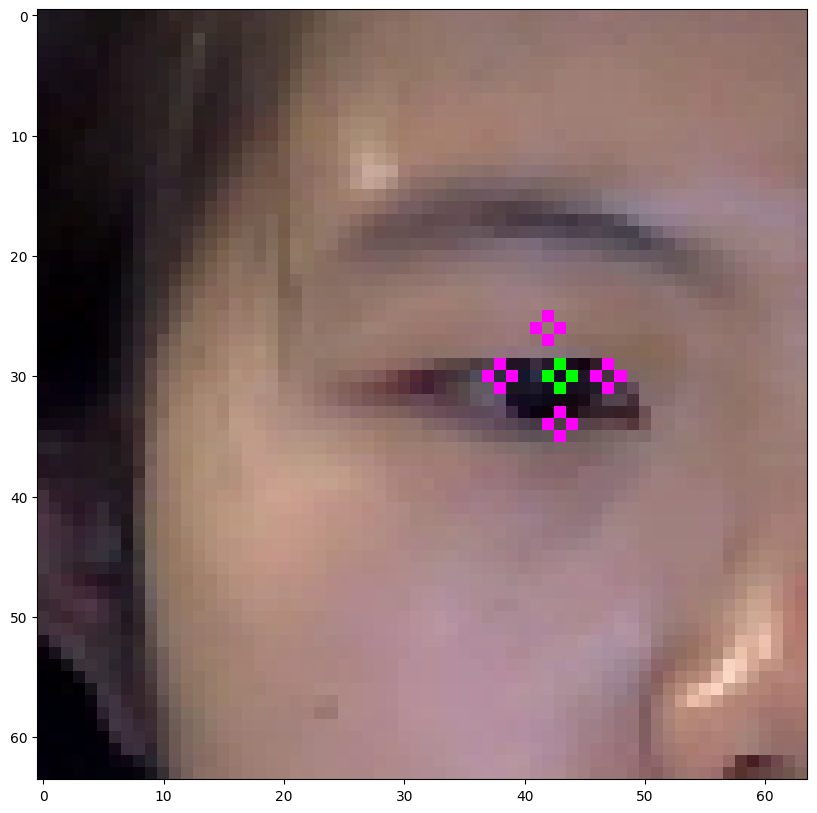

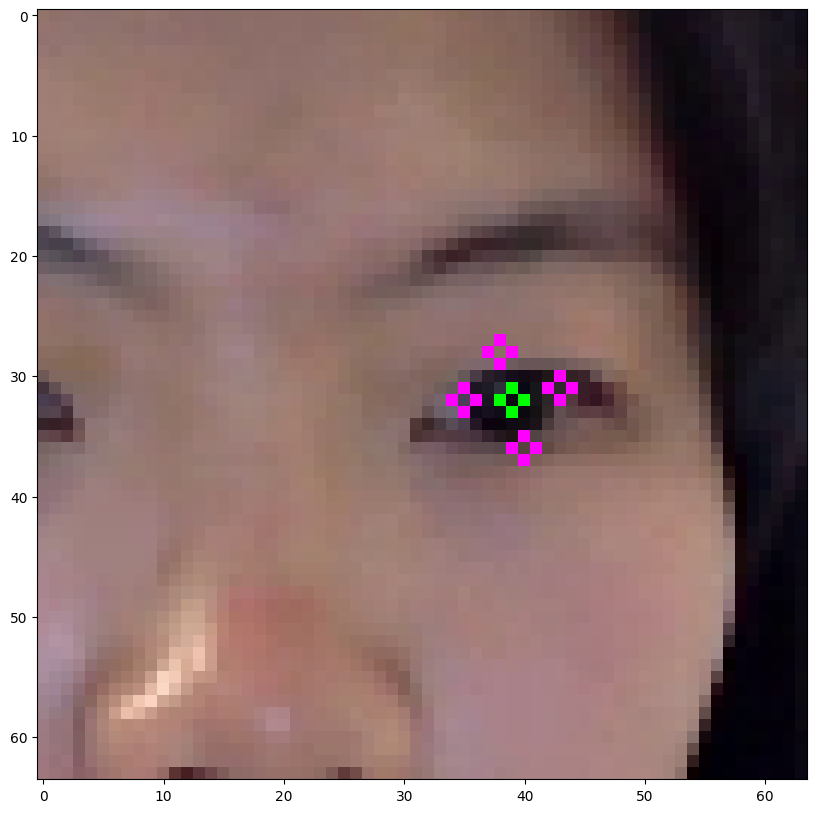

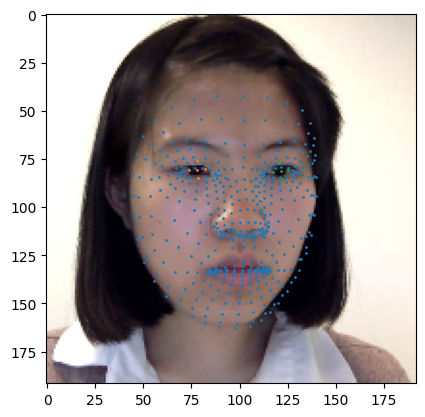

  1%|▋                                                                                         | 9/1227 [00:07<16:15,  1.25it/s]

/home/newuser/data/0_new_data/P_51/1493057462712_32_-study-tooth_abscess_writing/frame229.png


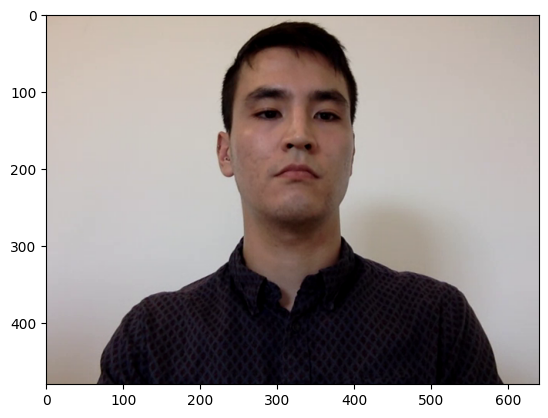

1


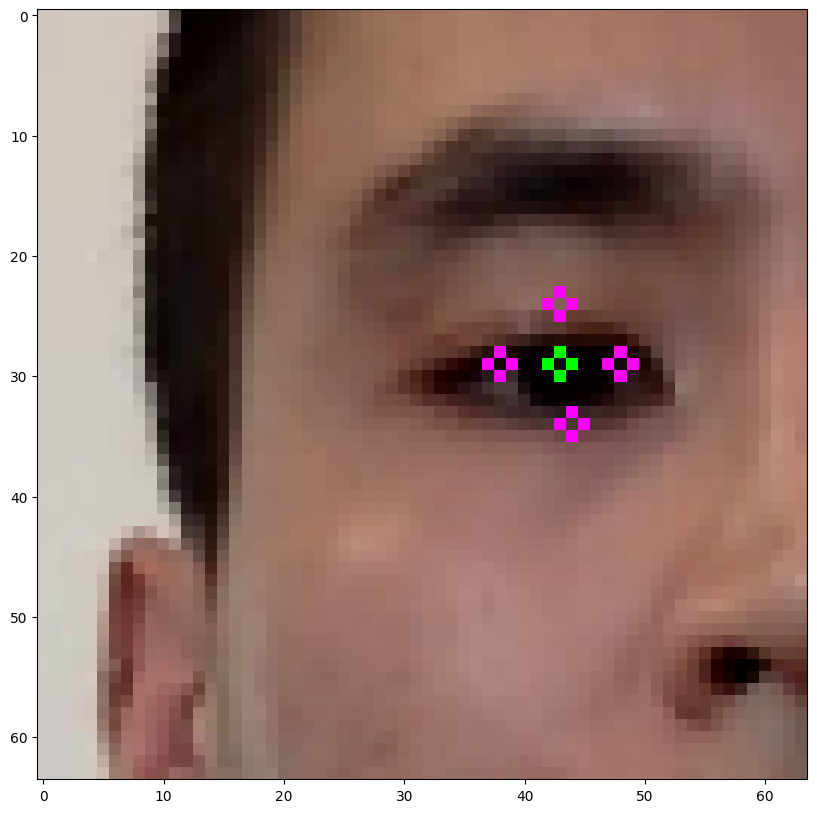

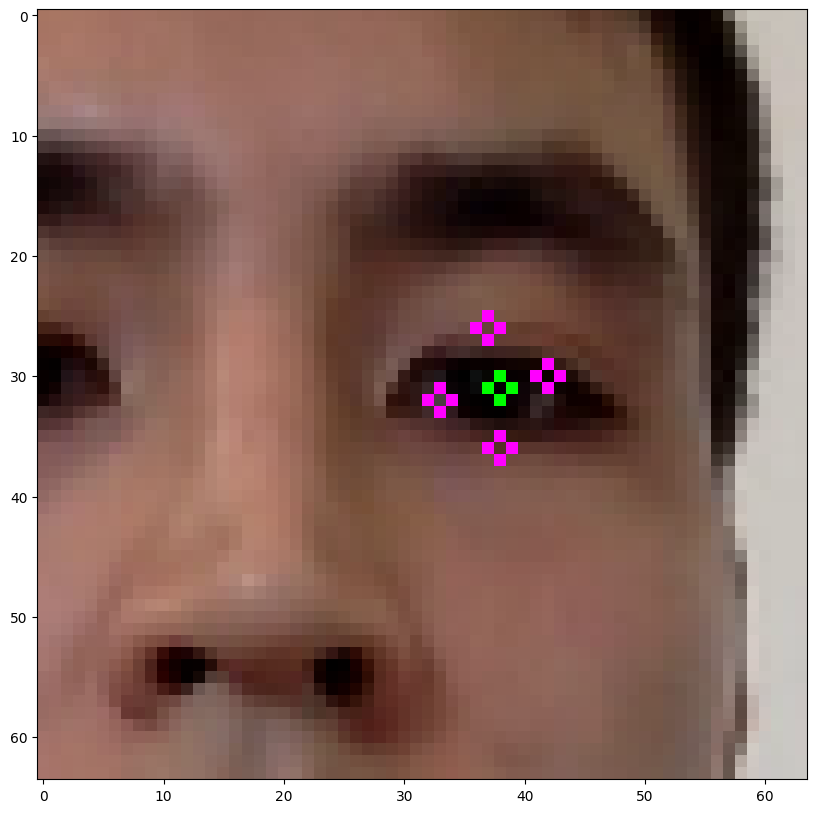

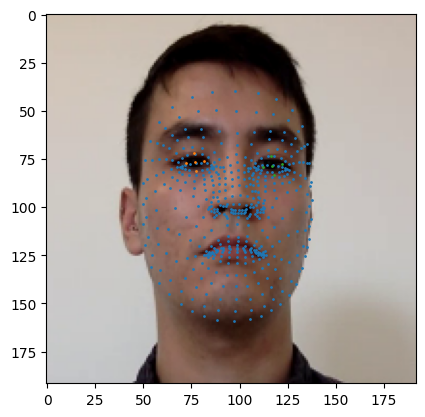

  1%|▋                                                                                        | 10/1227 [00:07<16:10,  1.25it/s]

/home/newuser/data/0_new_data/P_39/1492629177607_3_-study-dot_test/frame555.png


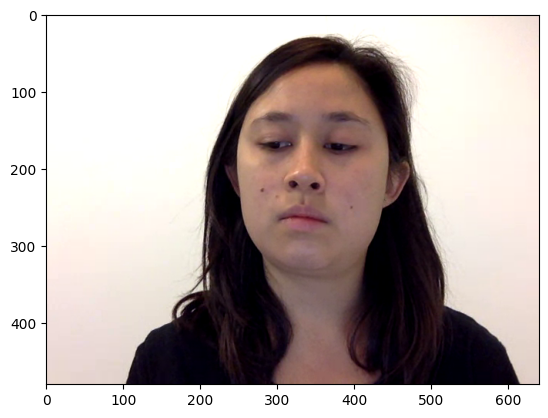

1


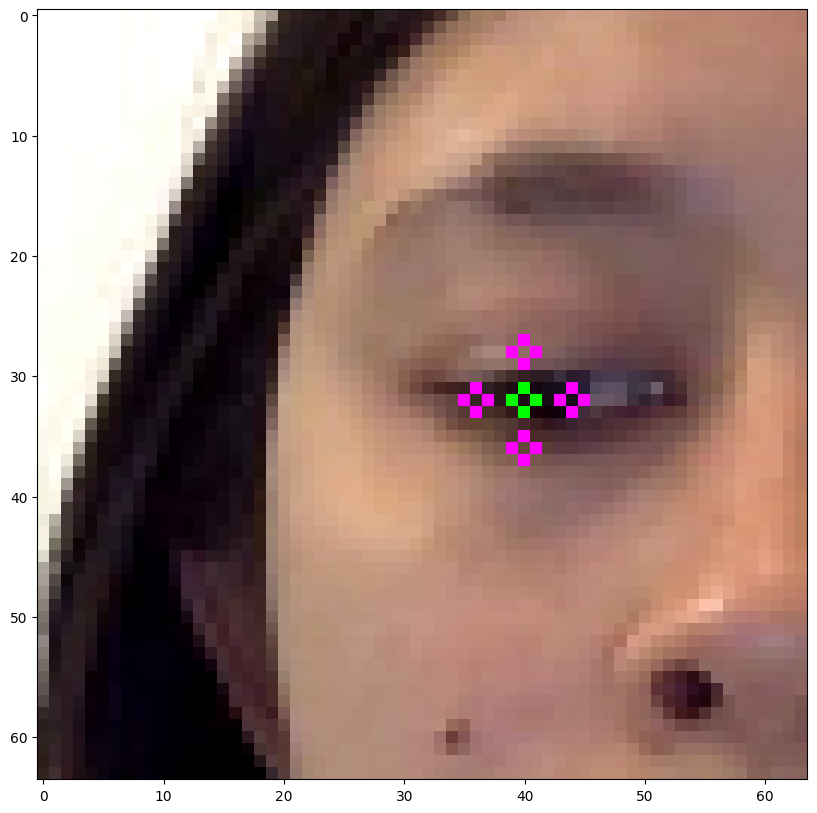

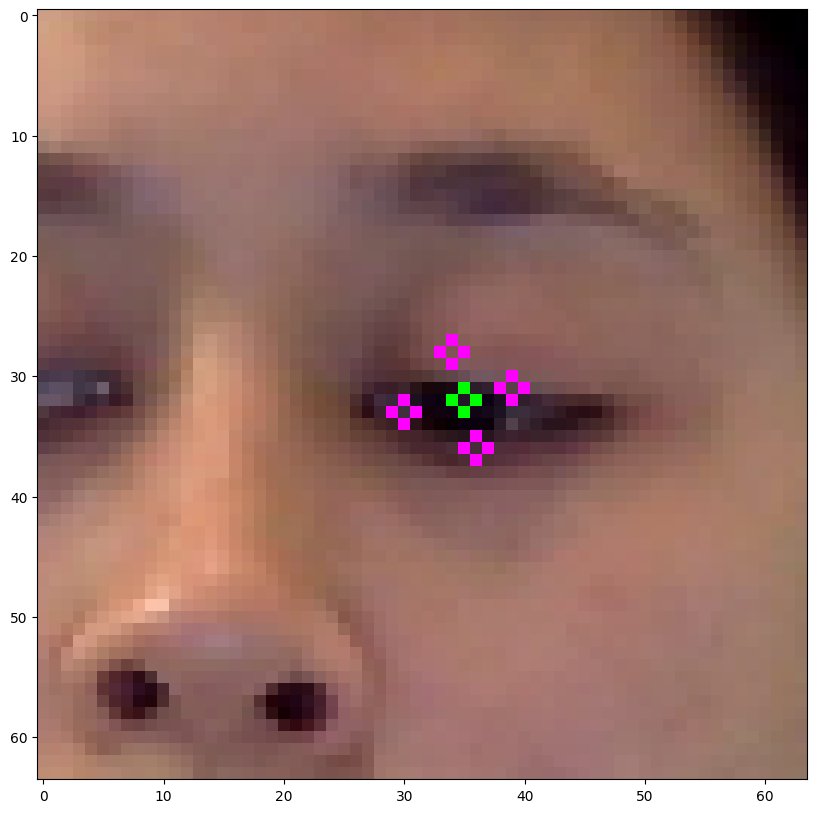

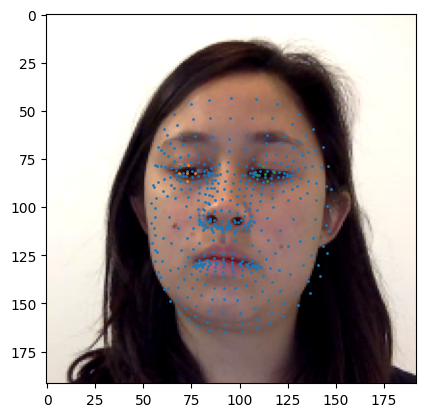

  1%|▊                                                                                        | 11/1227 [00:08<16:14,  1.25it/s]

/home/newuser/data/0_new_data/P_07/1491577862552_16_-study-where_to_find_morel_mushrooms_writing/frame60.png


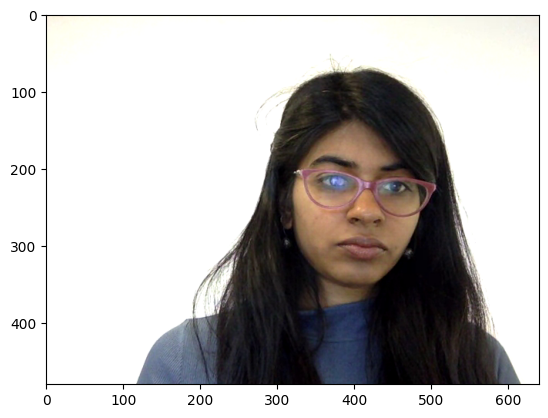

1


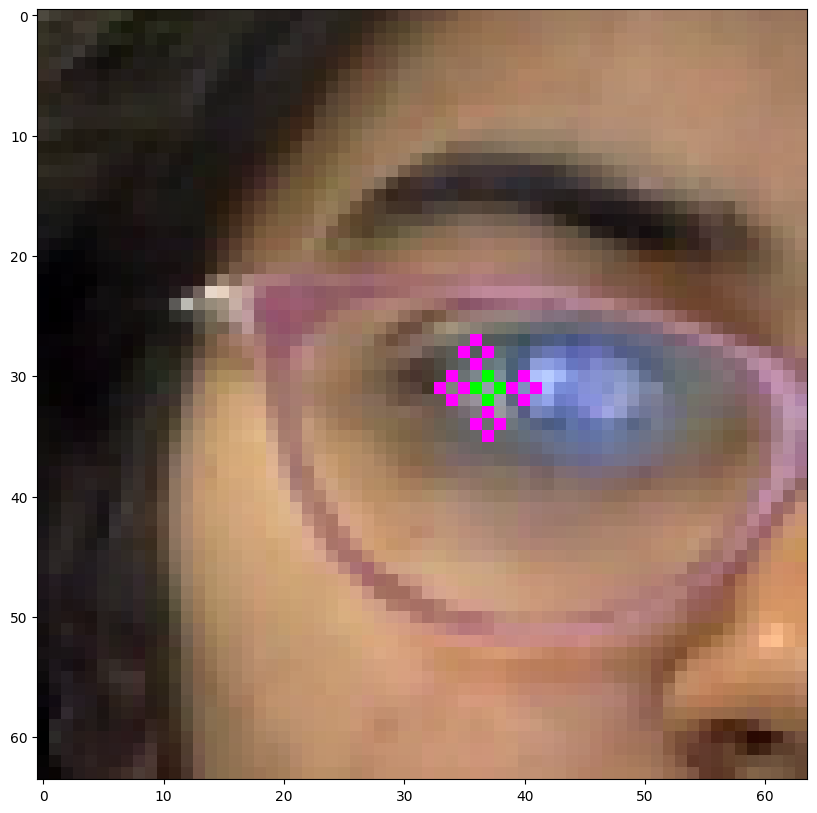

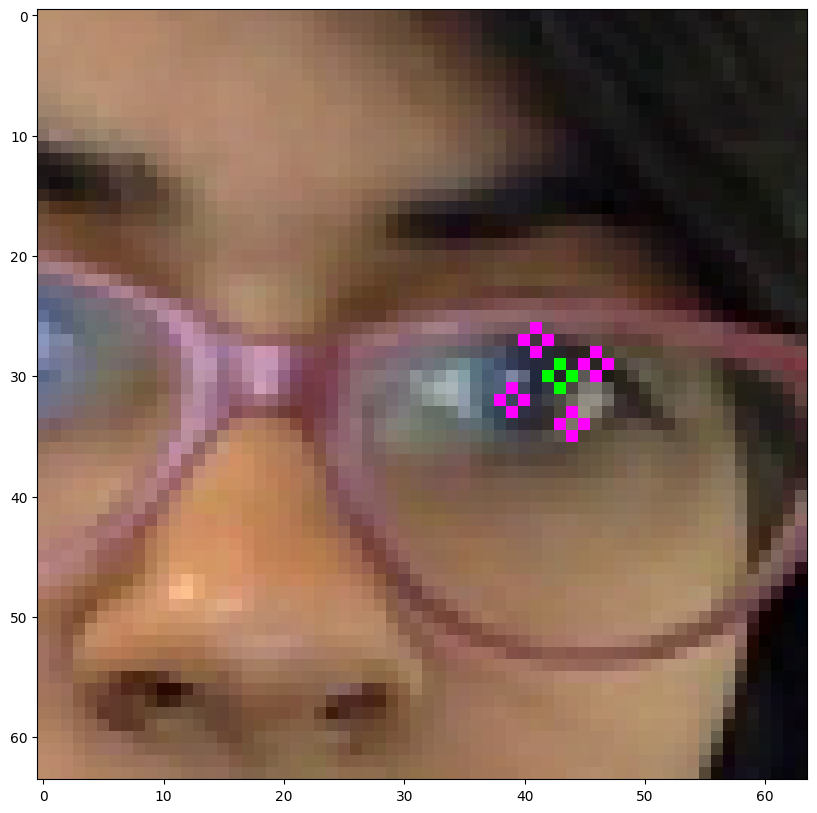

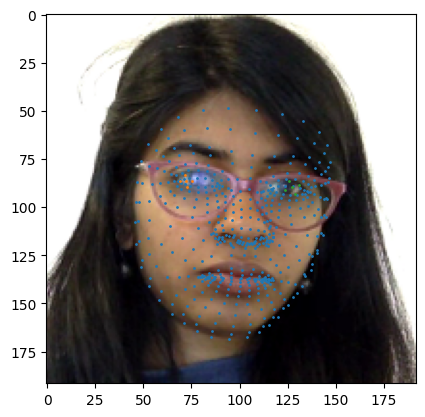

  1%|▊                                                                                        | 12/1227 [00:09<16:17,  1.24it/s]

/home/newuser/data/0_new_data/P_18/1492006065578_12_-study-educational_advantages_of_social_networking_sites_writing/frame498.png


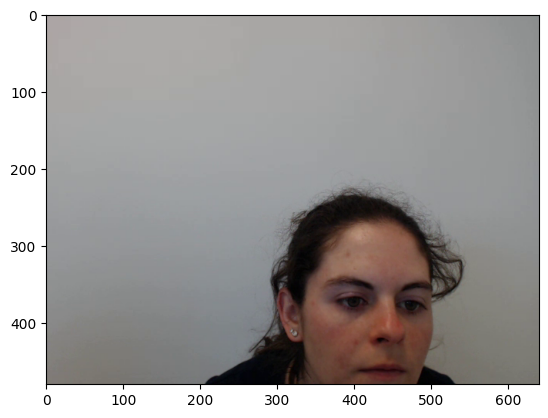

1


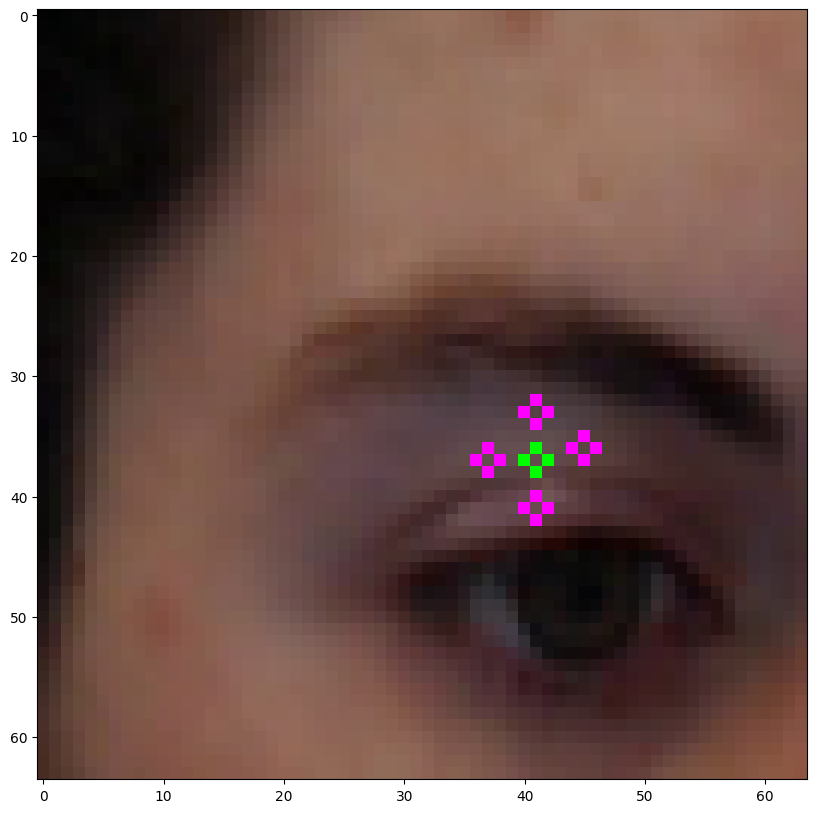

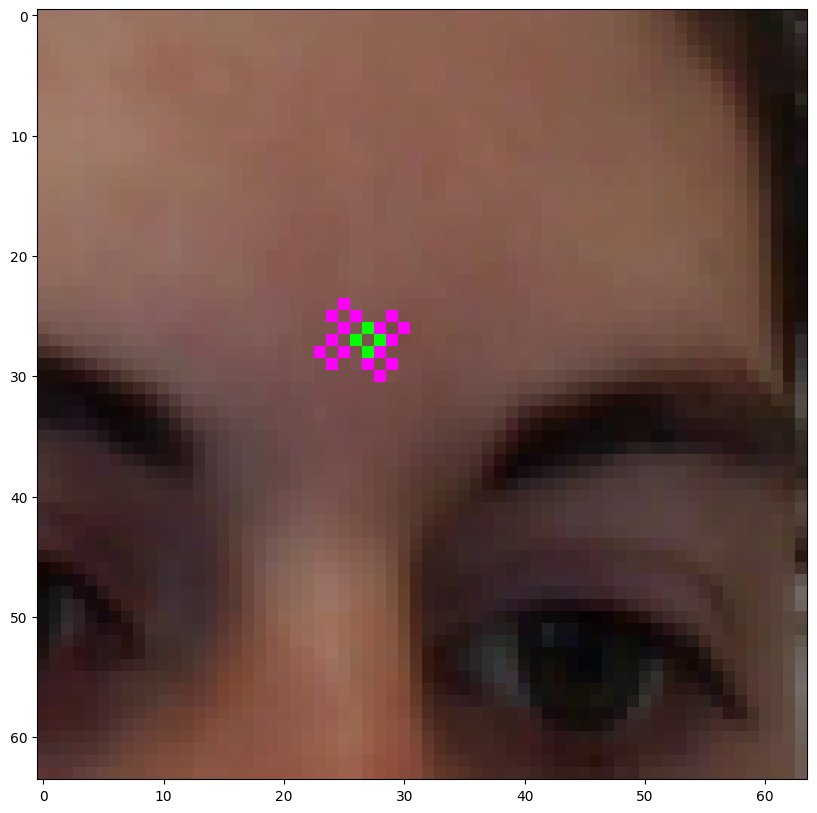

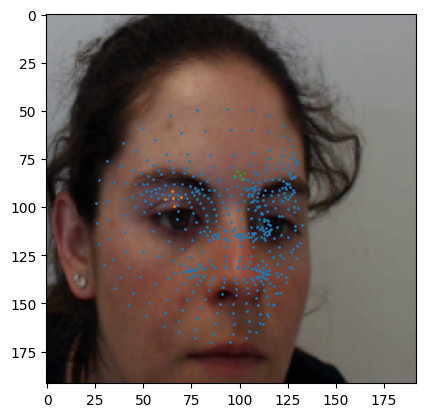

  1%|▉                                                                                        | 13/1227 [00:10<16:11,  1.25it/s]

/home/newuser/data/0_new_data/P_29/1492189262993_14_-study-benefits_of_running_writing/frame2990.png


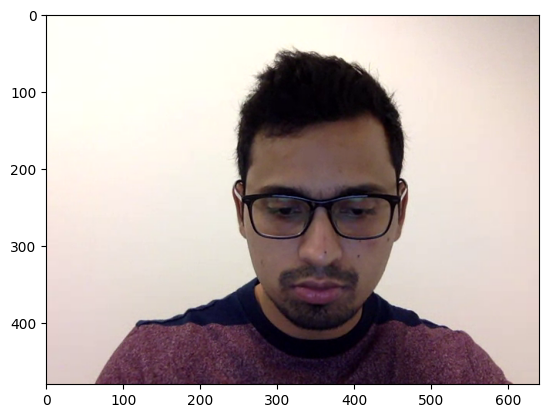

1


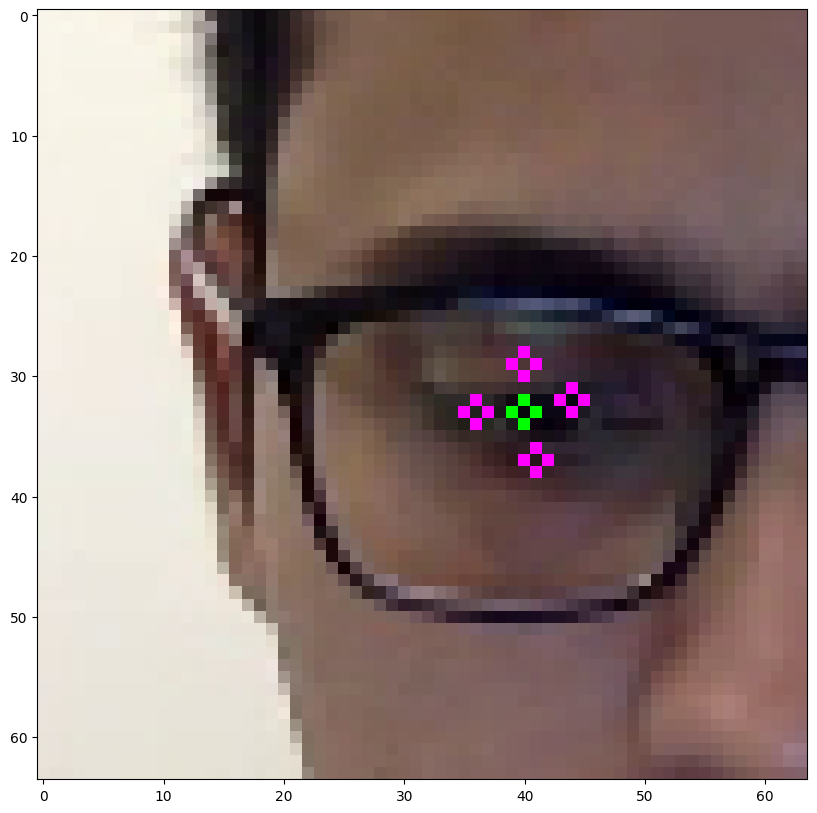

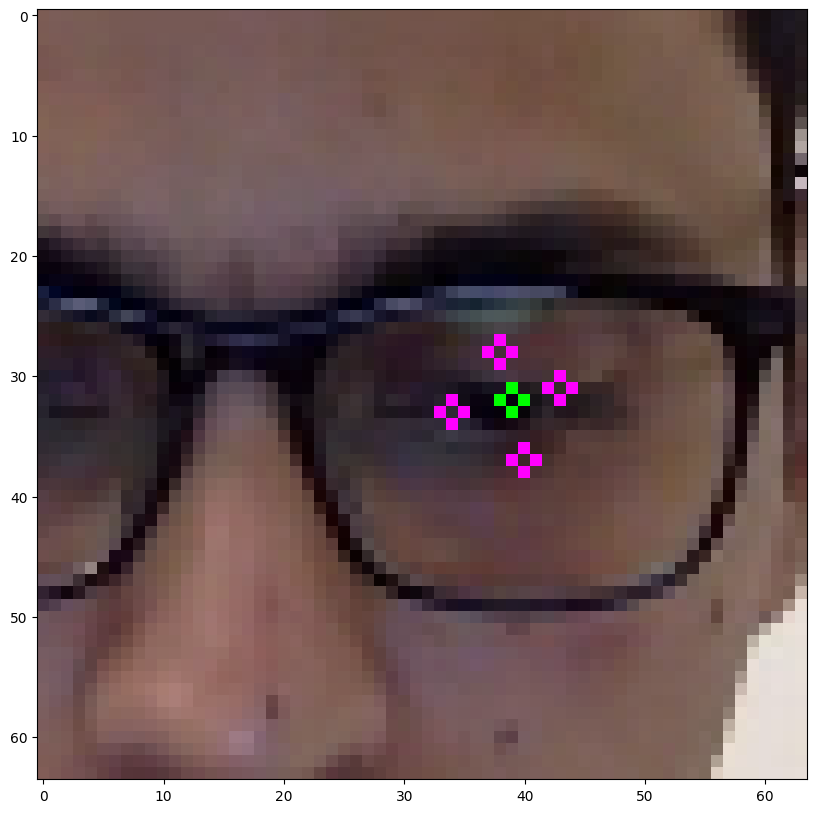

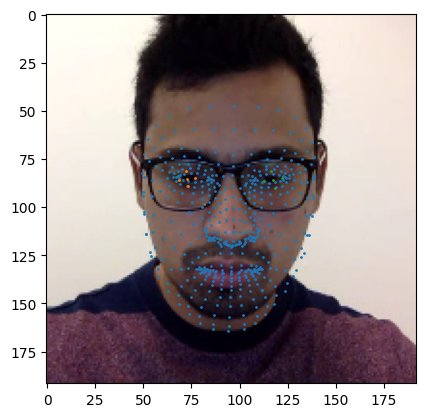

  1%|█                                                                                        | 14/1227 [00:11<19:51,  1.02it/s]

/home/newuser/data/0_new_data/P_18/1492006065578_3_-study-dot_test/frame296.png


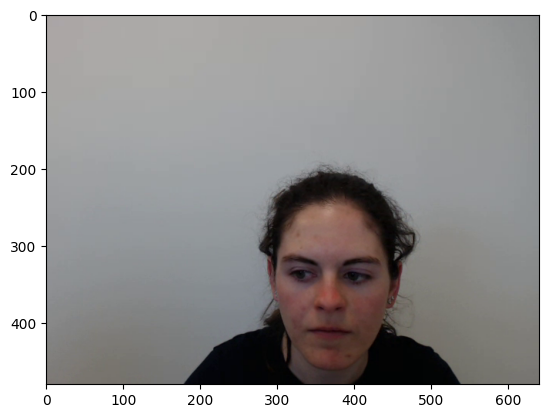

1


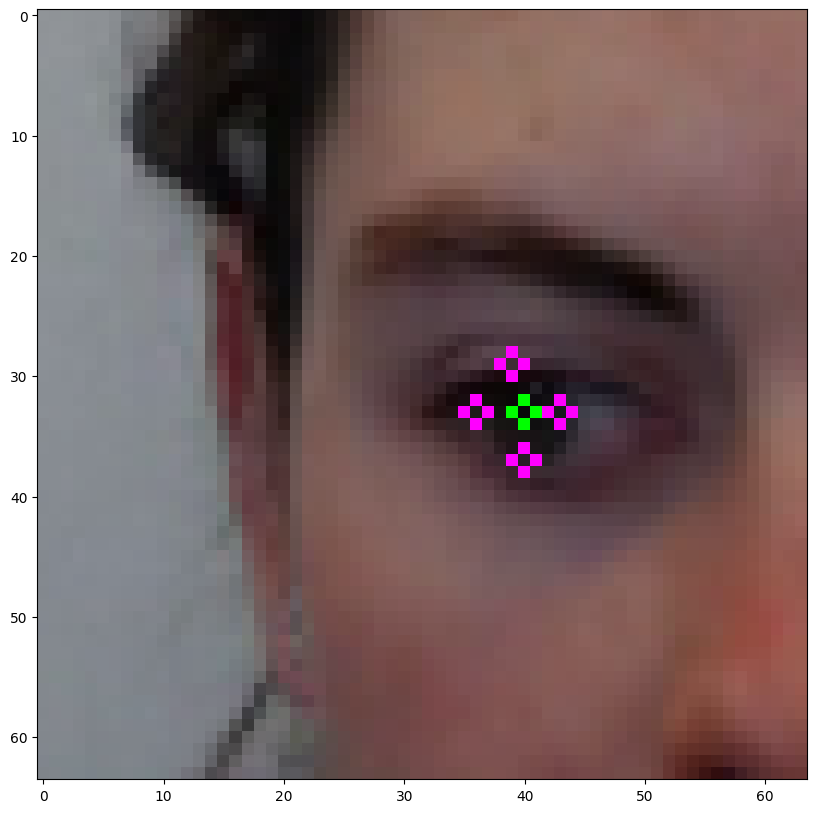

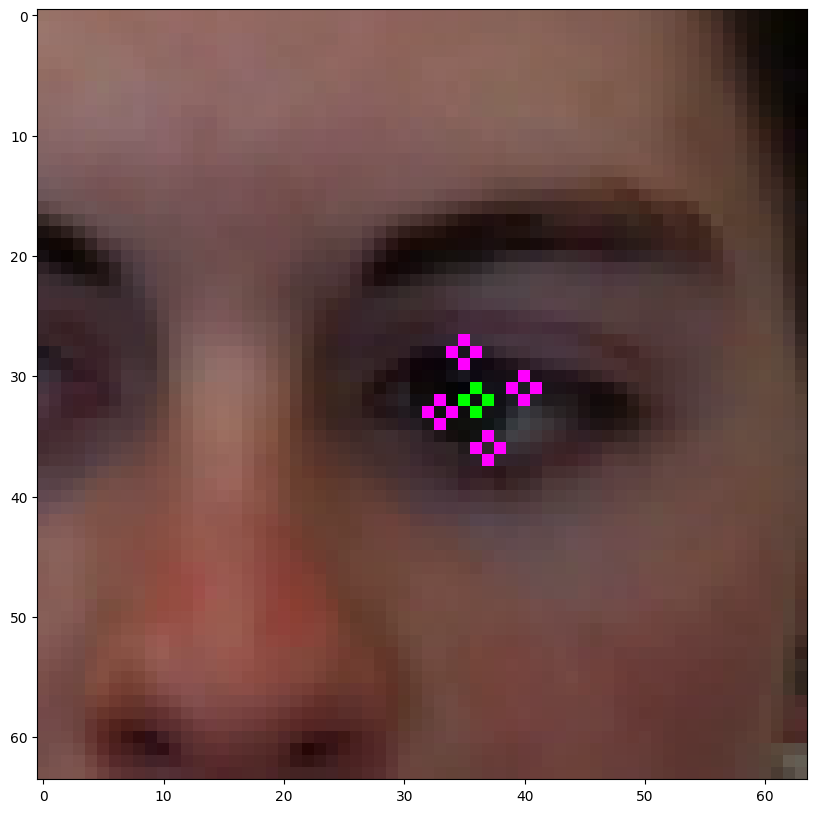

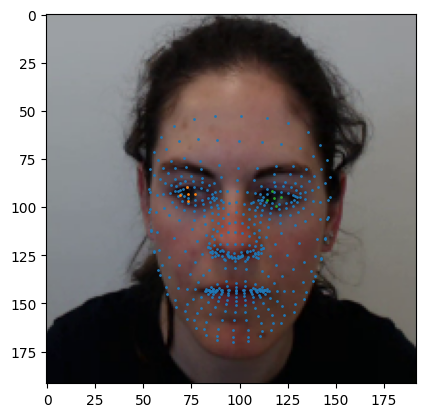

  1%|█                                                                                        | 15/1227 [00:12<18:34,  1.09it/s]

/home/newuser/data/0_new_data/P_37/1492546151879_16_-study-educational_advantages_of_social_networking_sites_writing/frame38.png


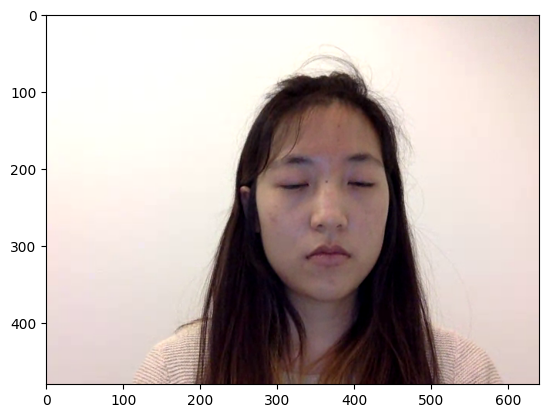

1


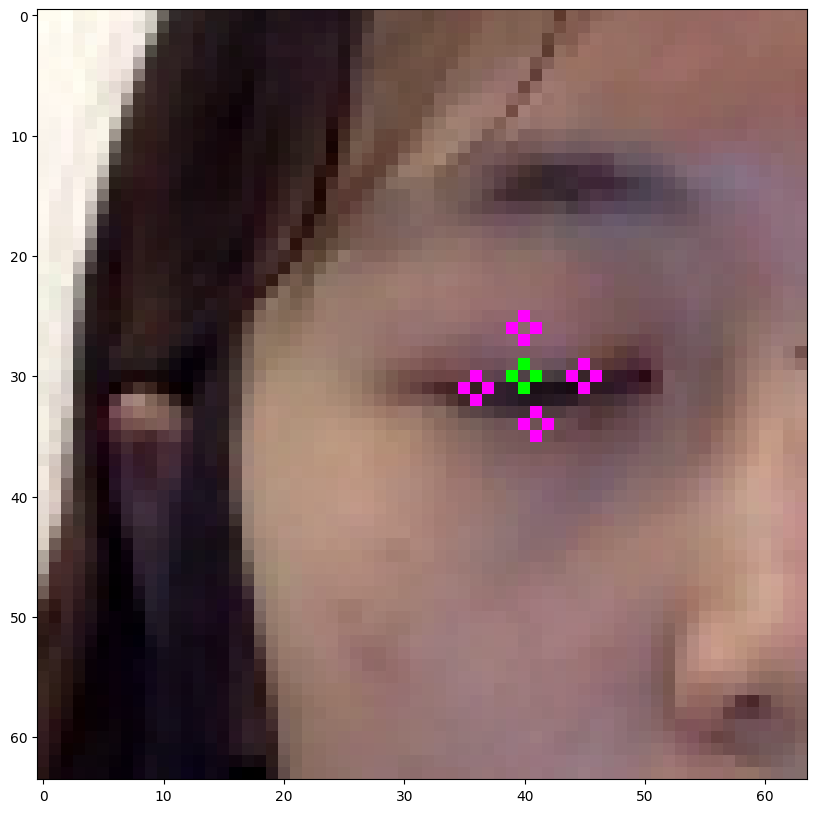

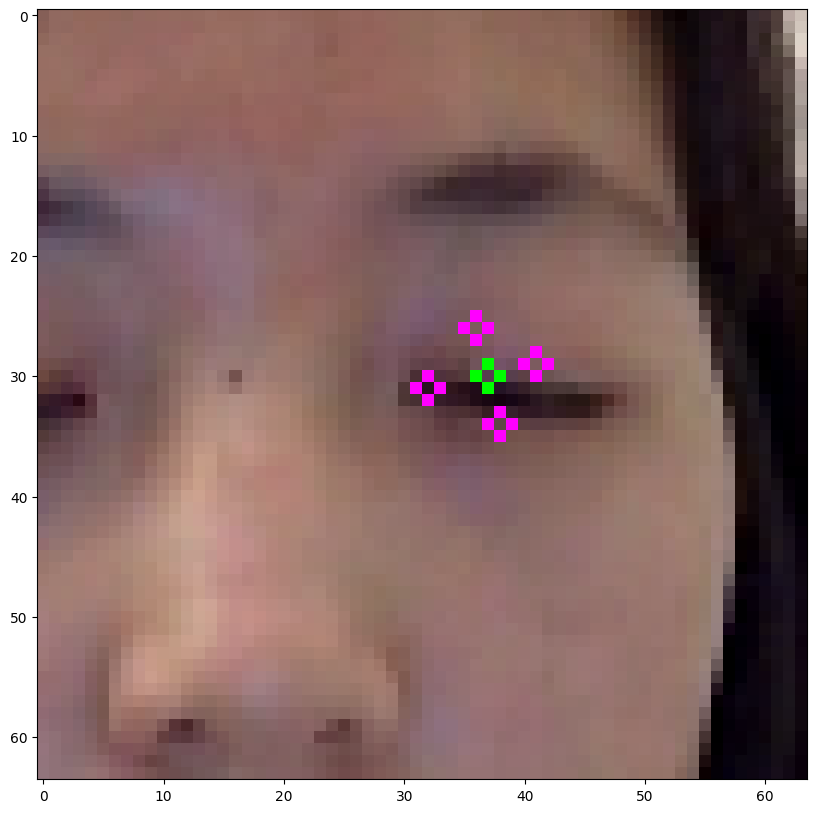

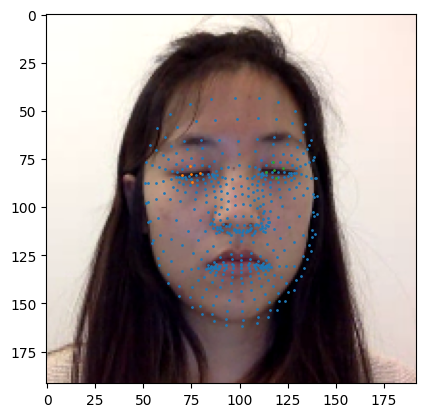

  1%|█▏                                                                                       | 16/1227 [00:13<17:56,  1.13it/s]

/home/newuser/data/0_new_data/P_13/1491923431229_21_-study-educational_advantages_of_social_networking_sites_writing/frame1009.png


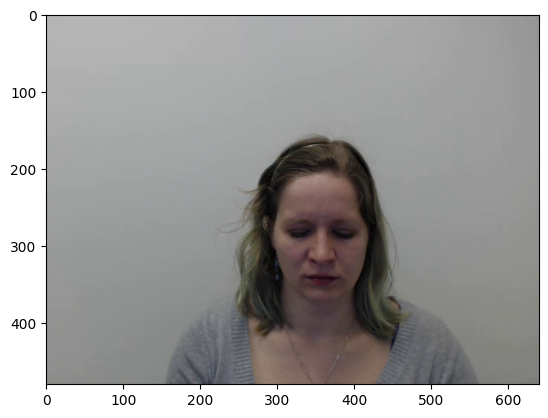

1


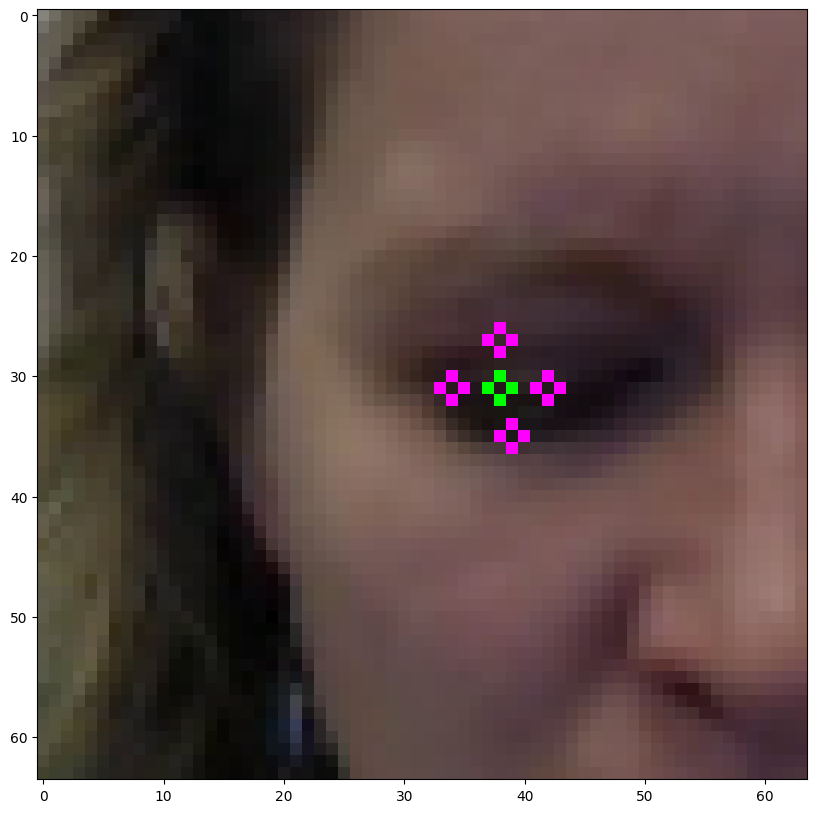

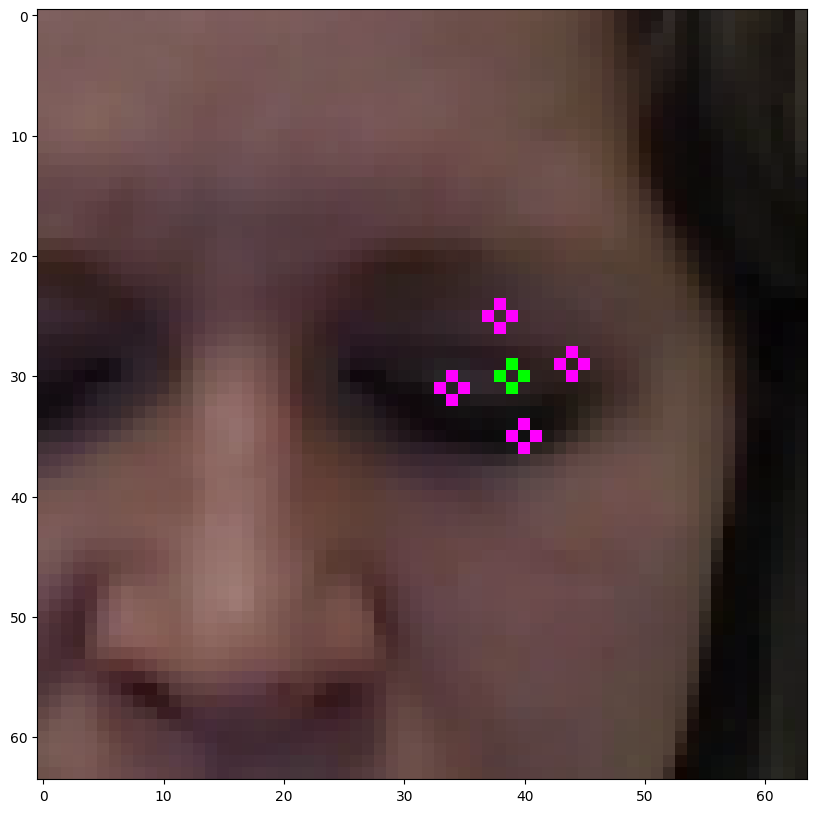

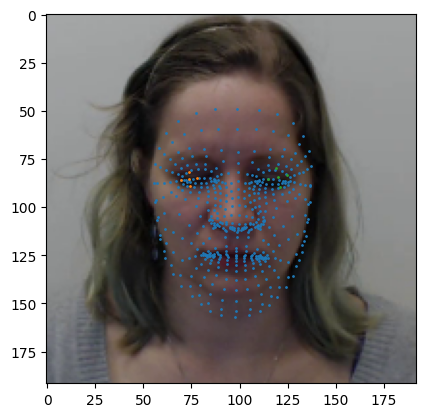

  1%|█▏                                                                                       | 17/1227 [00:14<17:17,  1.17it/s]

/home/newuser/data/0_new_data/P_16/1491937688450_3_-study-dot_test/frame531.png


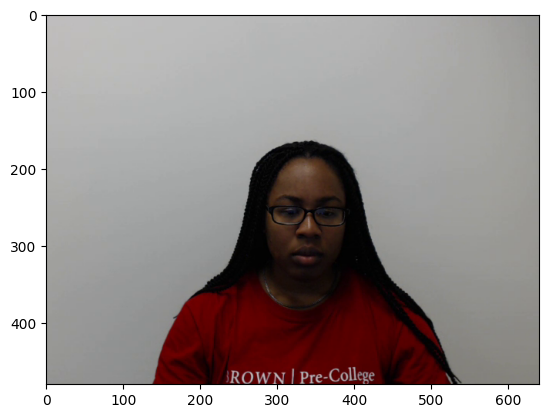

1


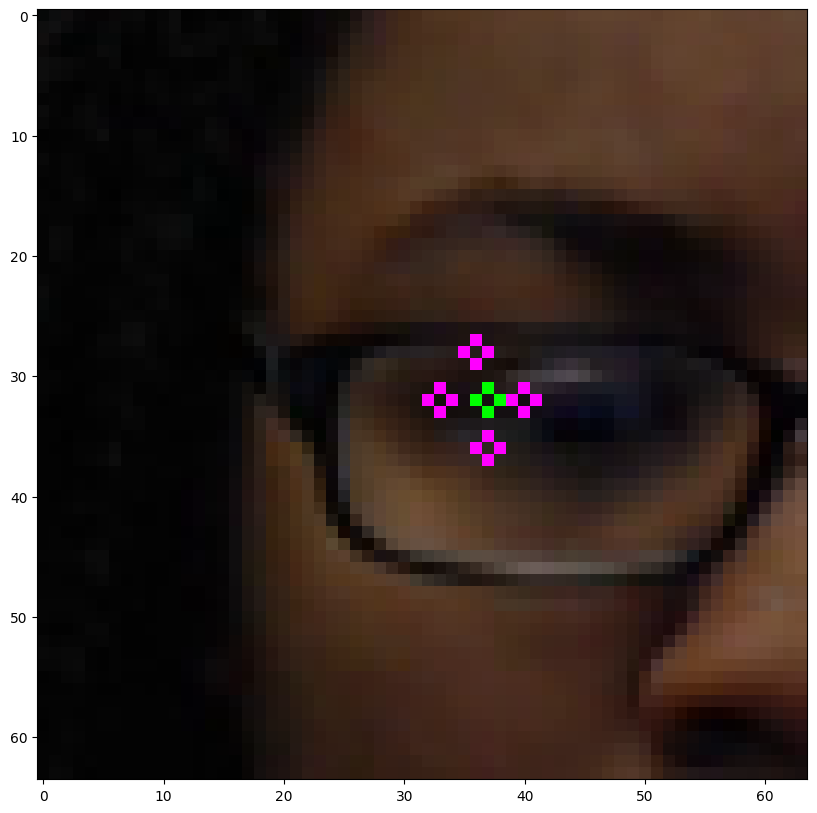

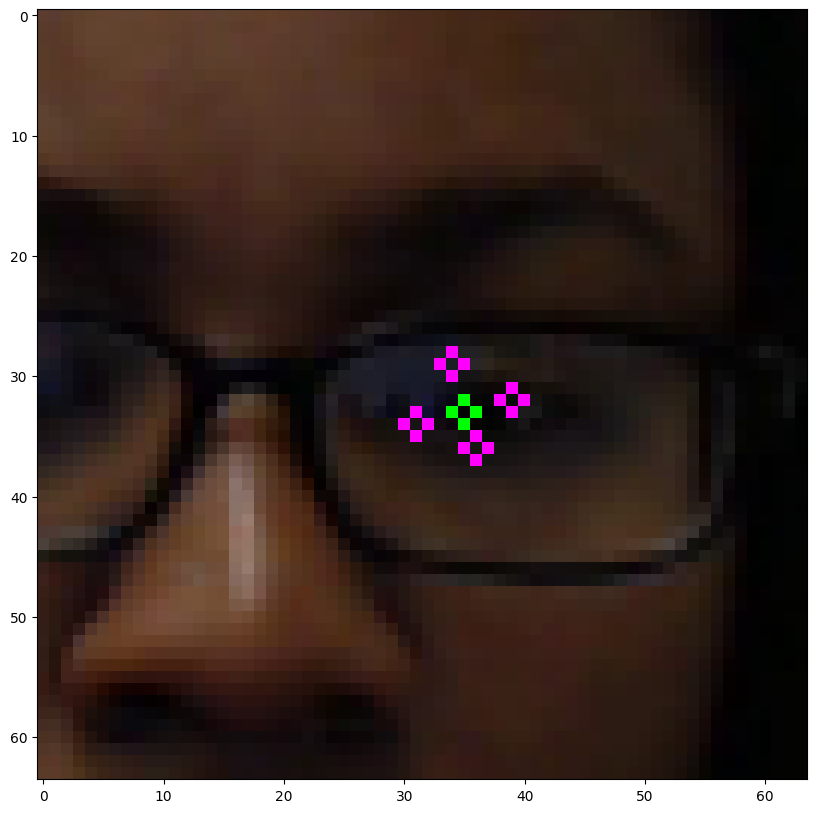

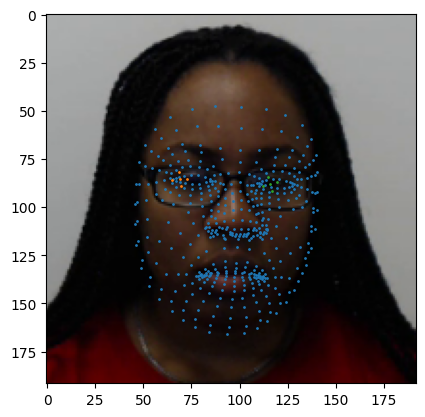

  1%|█▎                                                                                       | 18/1227 [00:14<16:47,  1.20it/s]

/home/newuser/data/0_new_data/P_17/1491942071066_19_-study-where_to_find_morel_mushrooms_writing/frame5853.png


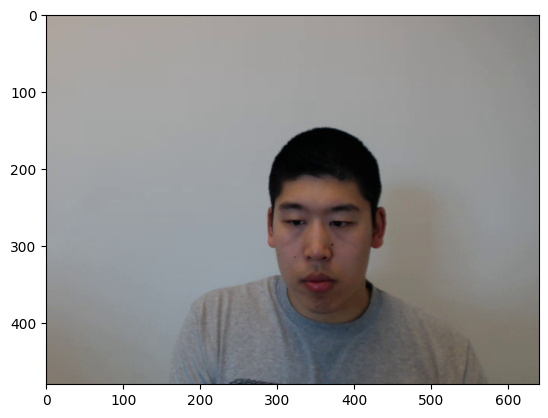

1


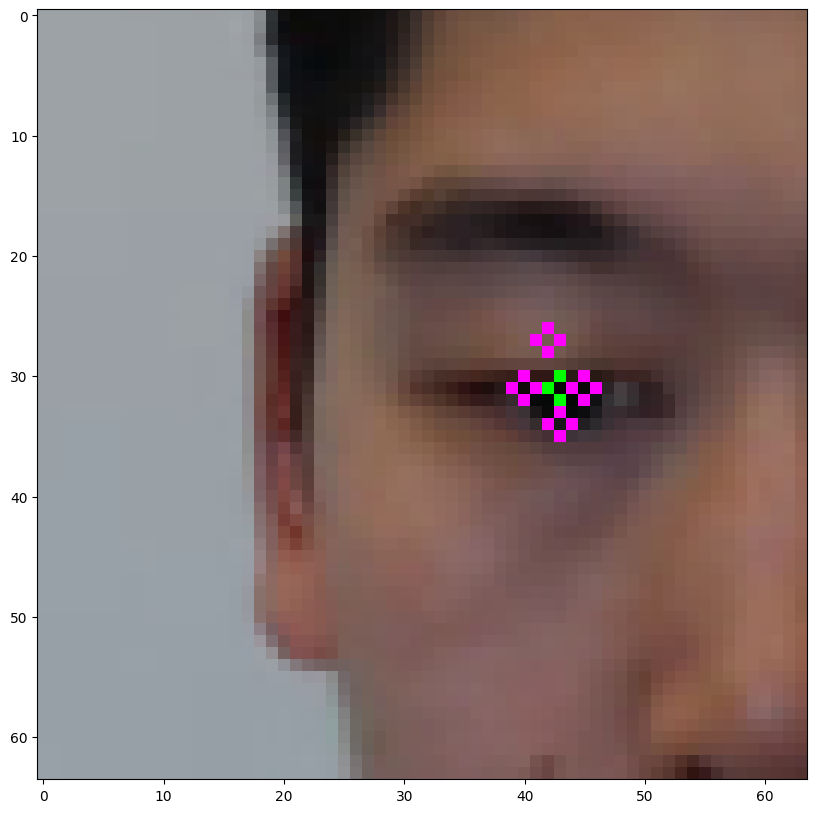

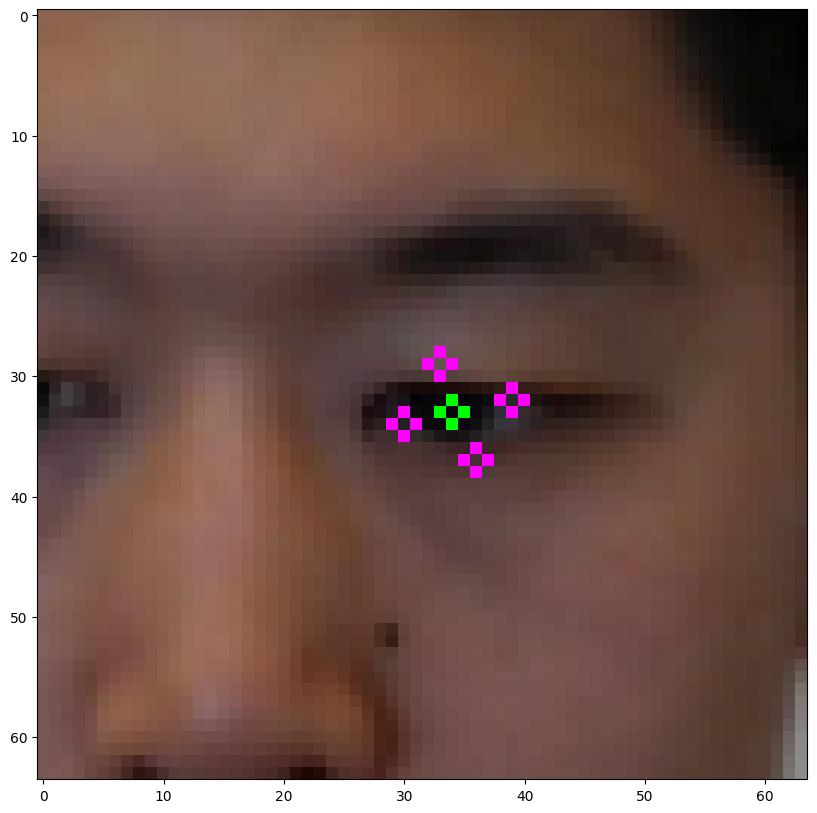

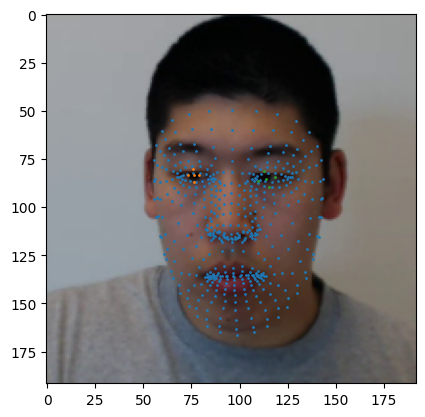

  2%|█▍                                                                                       | 19/1227 [00:15<16:28,  1.22it/s]

/home/newuser/data/0_new_data/P_17/1491942071066_24_-study-tooth_abscess_writing/frame359.png


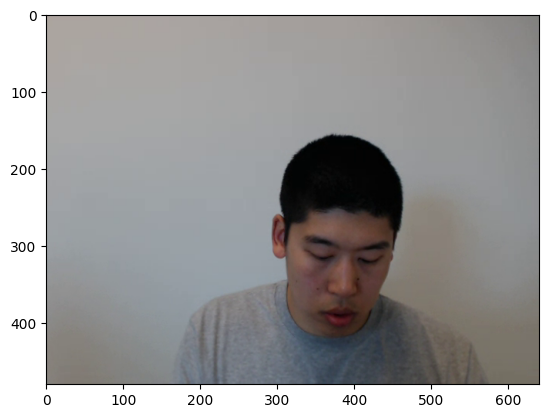

1


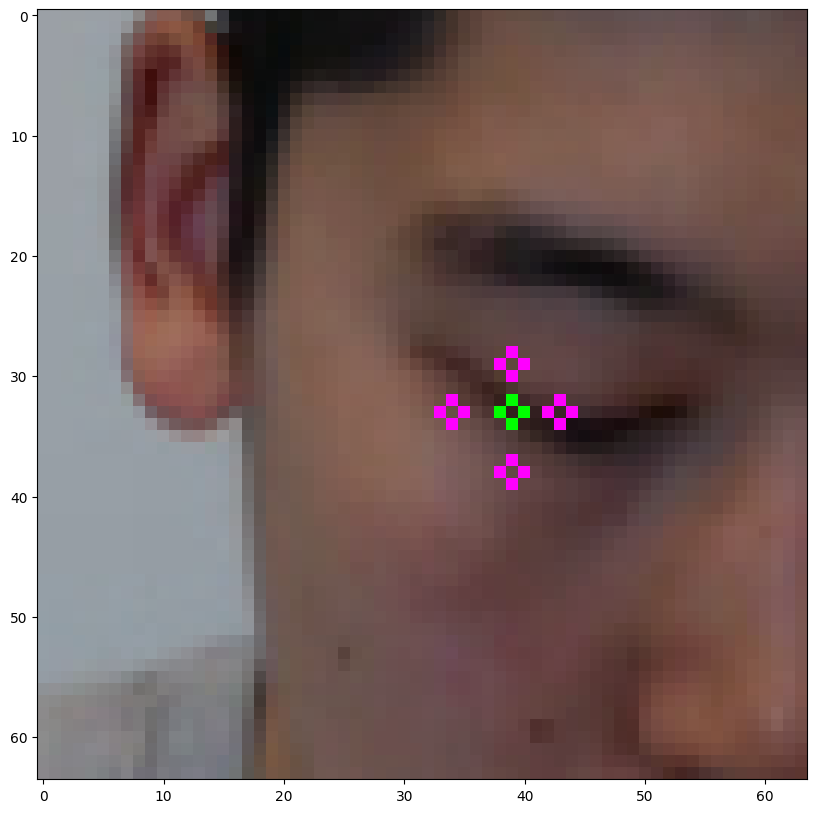

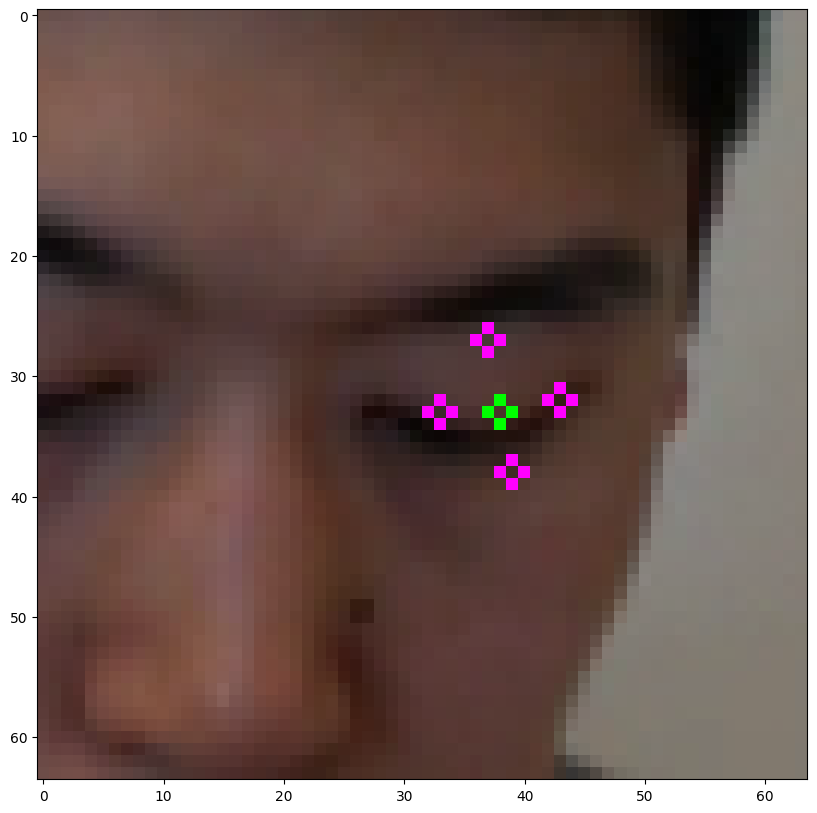

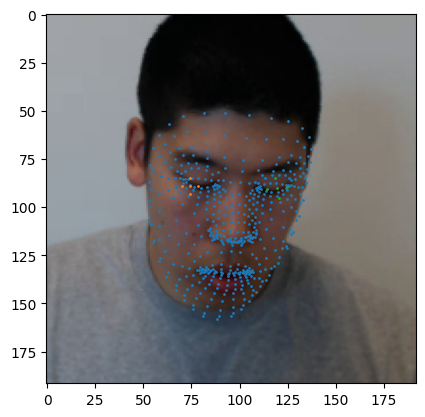

  2%|█▍                                                                                       | 20/1227 [00:16<16:14,  1.24it/s]

/home/newuser/data/0_new_data/P_29/1492189262993_32_-study-tooth_abscess_writing/frame519.png


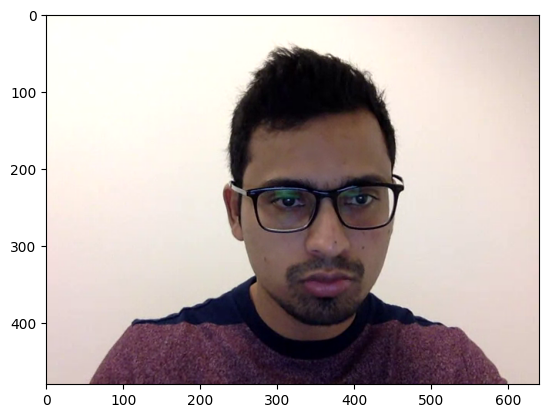

1


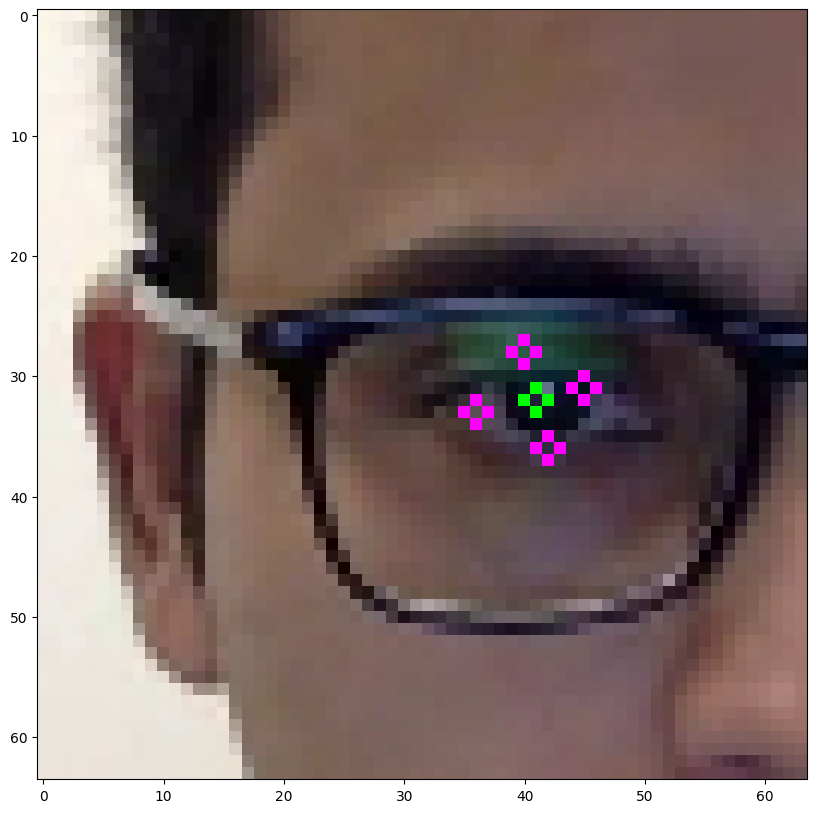

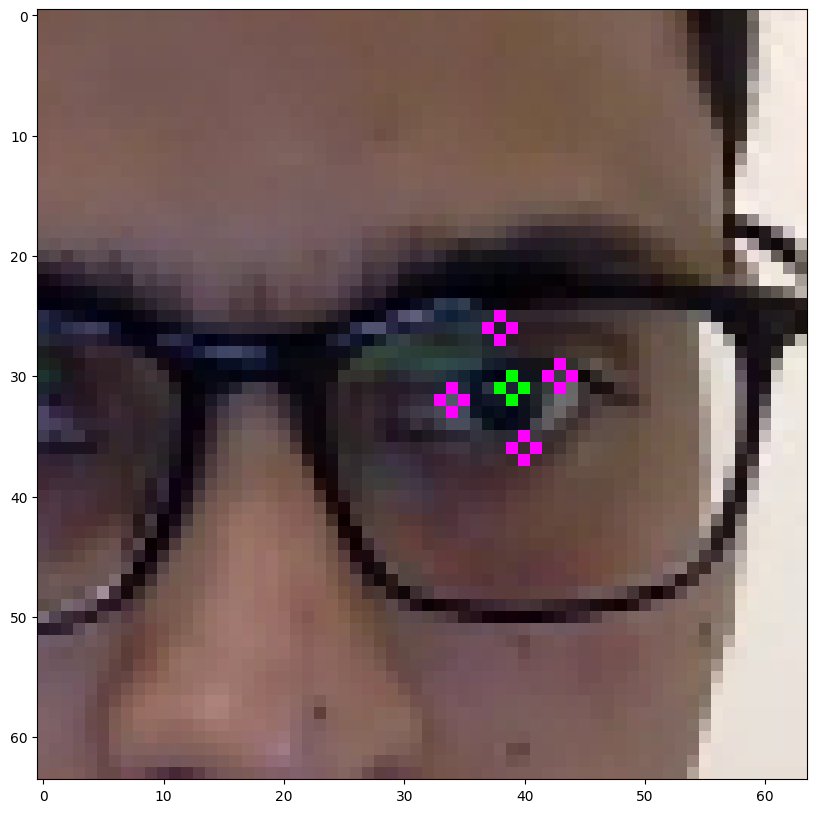

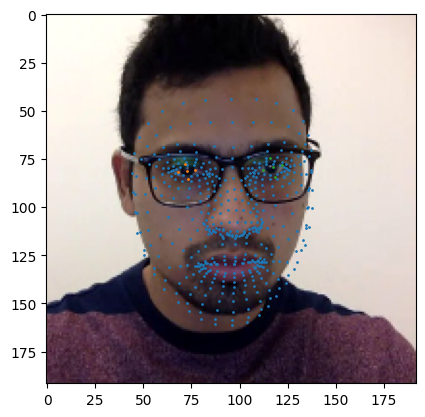

  2%|█▌                                                                                       | 21/1227 [00:17<16:36,  1.21it/s]

/home/newuser/data/0_new_data/P_51/1493057462712_26_-study-where_to_find_morel_mushrooms_writing/frame5424.png


In [139]:
i = 0
for path in tqdm(np.random.permutation(image_paths)):
    print(path)
    if i > 20:
        break
    _, _,_ = feature_extractor.extract_features(path, plot = True)
    i += 1

In [155]:
features_dict = {}
no_face_list = []
num_faces_list = []
for path in tqdm(image_paths):
    features_dict[path], no_face_path, num_faces = feature_extractor.extract_features(path)
    no_face_list += no_face_path
    num_faces_list.append(num_faces)

100%|███████████████████████████████████████████████████████████████████████████████████████| 1227/1227 [01:07<00:00, 18.07it/s]


In [156]:
import json

with open("../data/clicks_features.json", "w") as f:
    json.dump(features_dict, f)

In [160]:
with open("../data/no_face_list.npy", "wb") as f:
    np.save(f, no_face_list)

In [158]:
len(no_face_list)

70